In [1]:
import datetime as dt
from dateutil.relativedelta import relativedelta
import yfinance as yf  
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from pandas.tseries.holiday import USFederalHolidayCalendar
import datetime
import holidays
from statsmodels.tsa.stattools import adfuller
from dtaidistance import preprocessing
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler
from tsfresh import extract_features, select_features
from tsfresh.feature_extraction import MinimalFCParameters
from tsfresh.feature_selection.relevance import calculate_relevance_table
from tsfresh.utilities.dataframe_functions import impute
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from tslearn.utils import to_time_series_dataset
from tslearn.clustering import silhouette_score
from tslearn.metrics import dtw as ts_dtw, cdist_dtw
from tslearn.barycenters import dtw_barycenter_averaging
from sklearn.metrics import silhouette_score as sklearn_silhouette, calinski_harabasz_score, davies_bouldin_score
from pandas import option_context
import warnings
import itertools

### Draw Data from CSV

In [41]:
end = pd.to_datetime('2024-01-21')
start = pd.to_datetime('2024-01-21') - relativedelta(weeks=103)

years = [end.year-i for i in range(end.year-start.year + 1)]
nyse_holidays = holidays.NYSE(years=years)

In [2]:
data = pd.read_csv('SP500_Hourly_102Weeks_2024_01_14.csv', index_col=0, parse_dates=True)  
data.index = pd.to_datetime(data.index, utc=True).tz_convert('America/New_York')
data.head(10)

,Open,High,Low,Close,Adj Close,Volume
Datetime,,,,,,
2022-01-31 09:30:00-05:00,4431.790039,4472.020020,4414.020020,4458.209961,4458.209961,0
2022-01-31 10:30:00-05:00,4458.339844,4468.830078,4452.740234,4455.779785,4455.779785,310320785
2022-01-31 11:30:00-05:00,4456.299805,4483.180176,4453.419922,4477.540039,4477.540039,259708983
2022-01-31 12:30:00-05:00,4477.490234,4489.350098,4473.399902,4482.819824,4482.819824,237902000
2022-01-31 13:30:00-05:00,4482.890137,4497.709961,4479.939941,4497.709961,4497.709961,218623000
2022-01-31 14:30:00-05:00,4497.750000,4497.930176,4471.459961,4486.180176,4486.180176,291230000
2022-01-31 15:30:00-05:00,4486.189941,4516.890137,4482.020020,4515.439941,4515.439941,464471000
2022-02-01 09:30:00-05:00,4519.569824,4525.560059,4483.529785,4501.950195,4501.950195,0
2022-02-01 10:30:00-05:00,4501.970215,4522.270020,4493.779785,4512.879883,4512.879883,349426580


In [3]:
df = pd.DataFrame(data.Close)
display(df)

,Close
Datetime,
2022-01-31 09:30:00-05:00,4458.209961
2022-01-31 10:30:00-05:00,4455.779785
2022-01-31 11:30:00-05:00,4477.540039
2022-01-31 12:30:00-05:00,4482.819824
2022-01-31 13:30:00-05:00,4497.709961
...,...
2024-01-19 11:30:00-05:00,4809.129883
2024-01-19 12:30:00-05:00,4825.220215
2024-01-19 13:30:00-05:00,4835.379883


### Pre-Processing

#### Train-Test Split

In [4]:
import pandas as pd
import datetime
from datetime import datetime as dt
from dateutil.relativedelta import *

class TimeBasedCV(object):
    '''
    Parameters 
    ----------
    train_period: int
        number of time units to include in each train set
        default is 30
    test_period: int
        number of time units to include in each test set
        default is 7
    freq: string
        frequency of input parameters. possible values are: days, months, years, weeks, hours, minutes, seconds
        possible values designed to be used by dateutil.relativedelta class
        deafault is days
    '''
    
    
    def __init__(self, train_period=30, test_period=7, freq='days'):
        self.train_period = train_period
        self.test_period = test_period
        self.freq = freq

        
        
    def split(self, data, validation_split_date=None, date_column='record_date', gap=0):
        '''
        Generate indices to split data into training and test set
        
        Parameters 
        ----------
        data: pandas DataFrame
            your data, contain one column for the record date 
        validation_split_date: datetime.date()
            first date to perform the splitting on.
            if not provided will set to be the minimum date in the data after the first training set
        date_column: string, deafult='record_date'
            date of each record
        gap: int, default=0
            for cases the test set does not come right after the train set,
            *gap* days are left between train and test sets
        
        Returns 
        -------
        train_index ,test_index: 
            list of tuples (train index, test index) similar to sklearn model selection
        '''
        
        # check that date_column exist in the data:
        try:
            data[date_column]
        except:
            raise KeyError(date_column)
                    
        train_indices_list = []
        test_indices_list = []

        if validation_split_date==None:
            validation_split_date = data[date_column].min().date() + eval('relativedelta('+self.freq+'=self.train_period)')
        
        start_train = validation_split_date - eval('relativedelta('+self.freq+'=self.train_period)')
        end_train = start_train + eval('relativedelta('+self.freq+'=self.train_period)')
        start_test = end_train + eval('relativedelta('+self.freq+'=gap)')
        end_test = start_test + eval('relativedelta('+self.freq+'=self.test_period)')

        while end_test < data[date_column].max().date():
            # train indices:
            cur_train_indices = list(data[(data[date_column].dt.date>=start_train) & 
                                     (data[date_column].dt.date<end_train)].index)

            # test indices:
            cur_test_indices = list(data[(data[date_column].dt.date>=start_test) &
                                    (data[date_column].dt.date<end_test)].index)
            
            print("Train period:",start_train,"-" , end_train, ", Test period", start_test, "-", end_test,
                  "# train records", len(cur_train_indices), ", # test records", len(cur_test_indices))

            train_indices_list.append(cur_train_indices)
            test_indices_list.append(cur_test_indices)

            # update dates:
            start_train = start_train + eval('relativedelta('+self.freq+'=self.test_period)')
            end_train = start_train + eval('relativedelta('+self.freq+'=self.train_period)')
            start_test = end_train + eval('relativedelta('+self.freq+'=gap)')
            end_test = start_test + eval('relativedelta('+self.freq+'=self.test_period)')

        # mimic sklearn output  
        index_output = [(train,test) for train,test in zip(train_indices_list,test_indices_list)]

        self.n_splits = len(index_output)
        
        return index_output
    
    
    def get_n_splits(self):
        """Returns the number of splitting iterations in the cross-validator
        Returns
        -------
        n_splits : int
            Returns the number of splitting iterations in the cross-validator.
        """
        return self.n_splits 

In [5]:
tscv = TimeBasedCV(train_period=78,
                   test_period=6,
                   freq='weeks')

for train_index, test_index in tscv.split(df.reset_index(),
#                    validation_split_date=datetime.date(2019,2,1),
                                          date_column='Datetime'):
    print(f"train_index: {train_index}")
    print(f"test_index: {test_index}")

# get number of splits
tscv.get_n_splits()

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196
train_index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,

4

#### Prepare DataFrame for tsfresh

In [6]:
def process_data(train_df, test_df, single_length=True):
    train_grp_df = train_df.groupby(pd.Grouper(freq='W'))
    test_grp_df = test_df.groupby(pd.Grouper(freq='W'))
    
    train_combined_series = []
    train_combined_df = []
    test_combined_series = []
    test_combined_df = []
    
    if single_length:
        min_length = float('inf')

        for key, item in train_grp_df:
            item = train_grp_df.get_group(key)
            series = item.Close.to_numpy()
            min_length = min(min_length, series.shape[0])
            train_combined_series.append(series)
            
        for key, item in test_grp_df:
            item = test_grp_df.get_group(key)
            series = item.Close.to_numpy()
            min_length = min(min_length, series.shape[0])
            test_combined_series.append(series)

        for week_idx, series in enumerate(train_combined_series):
            series_normalized = rescale_data(resample_data(series, min_length)).reshape(min_length)
            week_df = pd.DataFrame(series_normalized)
    #         week_df['Datetime'] = item.index
            week_df['week'] = week_idx
    #         week_df.columns = ['Close', 'Datetime', 'Week']
            week_df.columns = ['Close', 'Week']
            train_combined_df.append(week_df)
            
        for week_idx, series in enumerate(test_combined_series):
            series_normalized = rescale_data(resample_data(series, min_length)).reshape(min_length)
            week_df = pd.DataFrame(series_normalized)
    #         week_df['Datetime'] = item.index
            week_df['week'] = week_idx
    #         week_df.columns = ['Close', 'Datetime', 'Week']
            week_df.columns = ['Close', 'Week']
            test_combined_df.append(week_df)
    
# Allow different length of series
#     for week_idx, key in enumerate(grp_df.groups.keys()):
#         item = grp_df.get_group(key)
#         series = item.Close.to_numpy()
#         series_rescaled = rescale_data(series.reshape(-1, 1))
#         week_df = pd.DataFrame(series)
#         week_df['Datetime'] = item.index
#         week_df['week'] = week_idx
#         week_df.columns = ['Close', 'Datetime', 'Week']
#         combined_df.append(week_df)
        
    return pd.concat(train_combined_df), pd.concat(test_combined_df)

def resample_data(df, length):
    Resampler = TimeSeriesResampler(sz=length)
    return Resampler.fit_transform(df)

def rescale_data(df):
    # Default mean = 0, std = 1
    Scaler = TimeSeriesScalerMeanVariance()
    return Scaler.fit_transform(df)

#### Analyze PCA plot and cluster results for a single iteration of Train-Test-Split

In [7]:
def generate_train_test_splits(df):
    datasets = []
    df = df.reset_index()
    
    tscv = TimeBasedCV(train_period=78, test_period=6, freq='weeks')
    
    for train_index, test_index in tscv.split(df, date_column='Datetime'):
        X_train_full = df.loc[train_index]
        X_train_full.set_index("Datetime", inplace = True)
        X_test_full = df.loc[test_index]
        X_test_full.set_index("Datetime", inplace = True)
        X_train, X_test = process_data(X_train_full, X_test_full)

        datasets.append([X_train, X_test])
        
    return datasets

#### Analyzing the third train-test period

In [8]:
# Deeper analysis on the ith train test set
train_df_3, test_df_3 = generate_train_test_splits(df)[2]

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


In [9]:
def tsfresh_extract_features(df):
    X_extracted = extract_features(df, column_id='Week', impute_function=impute,
#                                           default_fc_parameters=MinimalFCParameters()
                                         )
    
    display(X_extracted)

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(X_extracted)
    
    return scaled_data, X_extracted

In [10]:
formatted_data, extracted_data = tsfresh_extract_features(train_df_3)

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.90it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,5.018208e-13,24.0,0.621284,-0.117071,-0.010043,0.013040,...,1.072017,1.285293,1.925121,1.576898,2.318368,2.787788,2.944439,2.890372,0.0,1.640659
1,1.0,0.0,0.0,0.0,-8.615331e-14,24.0,0.592768,-0.033562,0.033783,0.024077,...,1.072017,1.418069,2.351673,1.708708,2.375647,2.926418,2.944439,2.890372,0.0,1.551195
2,0.0,0.0,0.0,0.0,6.150636e-14,24.0,0.484463,-0.010443,0.011137,0.481173,...,0.687092,1.178655,2.057898,1.571197,2.334549,2.857103,2.871476,2.890372,0.0,1.506075
3,1.0,0.0,0.0,0.0,-1.709743e-13,24.0,0.302137,-0.068818,0.022547,-0.138479,...,0.535961,0.535961,1.178655,1.518350,2.265239,2.649159,2.770974,2.813355,0.0,1.483494
4,0.0,0.0,0.0,0.0,1.256772e-13,24.0,0.247025,0.117478,-0.001461,-0.464381,...,0.271189,0.535961,1.285293,1.112021,1.659081,2.037405,2.287773,2.428274,0.0,1.519176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
74,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
75,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
76,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417


In [11]:
def plot_pca_components(data):    
    # Visualize how many components to use in PCA
    pca = PCA()
    pca.fit(data)
    plt.figure(figsize=(20,10))
    plt.grid()
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of components')
    plt.ylabel('Cumulative explained variance')

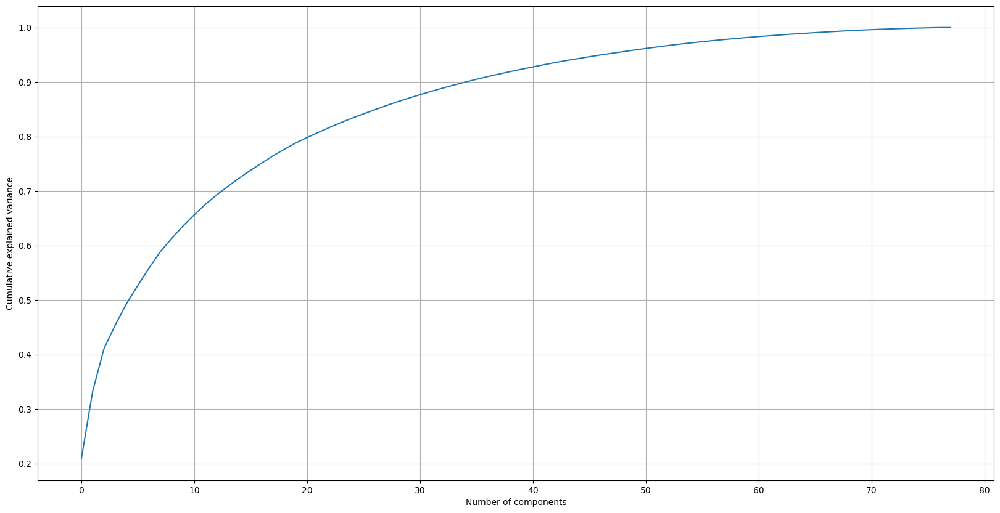

In [12]:
plot_pca_components(formatted_data)

In [13]:
def plot_pca_3components(component_data, column_names):

    df_components = pd.DataFrame(component_data, index=['PC1', 'PC2', 'PC3'])
    print("Principal Component Values")
    display(df_components)
    
#     num = len(component_data)
#     for i in range(num):
        
        
#         plt.plot(component_data[i])
#         plt.title(f'PC{i+1}')

    df_components_transposed = df_components.T
    
    fig = px.line(df_components_transposed, color_discrete_sequence= ['dodgerblue', 'orange', 'seagreen'])

    fig.update_layout(title='Sensitivity of different time series characteristics to each PC',
                      yaxis_title='Loading (sensitivity)',
                      xaxis_title='TSFresh Extracted Time Series Characteristics',
                      width = 1000,
                      plot_bgcolor='white'
                     )
    
    fig.update_xaxes(
            mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey',
    )

    fig.update_yaxes(
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey'
    )

    fig.show()
    
    # Display top N components for each PC
    print('Displaying Top N features based on sensitivity for each PC')
    N = 3
    topN_components = df_components.apply(lambda x: [column_names[i] for i in x.nlargest(N).index.values], axis=1)
    with option_context('display.max_colwidth', 400):
        display(pd.DataFrame(topN_components.to_list(), index=topN_components.index, columns=[f'Top {i} Feature' for i in range(1, N+1)]))
    

In [14]:
def calculate_plot_wcss(pca_data_train, min_clusters, max_clusters):
    # Ignore memory leak warning for Kmeans
    warnings.filterwarnings('ignore')

    wcss = []
    models = []

    # Seed is standardized across all experiemends
    seed = 0
    for i in range(min_clusters, max_clusters + 1):
        km = KMeans(n_clusters=i, max_iter=10, n_init=2, random_state=seed) 
        km.fit(pca_data_train)
        models.append(km)
        wcss.append(km.inertia_)

    plt.figure(figsize=(12,6))
    plt.grid()
    plt.plot(range(min_clusters,  max_clusters + 1), wcss,marker='o', linestyle='--')
    plt.xticks(range(min_clusters,  max_clusters + 1))
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.show()
    
    return models, wcss

,%Variance,%CumulativeVariance
PC1,20.886863,20.886863
PC2,12.326351,33.213215
PC3,7.830315,41.043529


Principal Component Values


,0,1,2,3,4,5,6,7,8,9,...,773,774,775,776,777,778,779,780,781,782
PC1,-0.027094,1.110223e-16,0.000000e+00,-2.775558e-17,-0.004591,-4.922278e-17,-0.052042,0.104194,-0.012147,-0.029346,...,-0.058326,-0.043682,-0.051998,-0.038614,-0.043565,-0.053187,-0.048361,-0.046652,0.0,-0.027793
PC2,-0.008502,-8.326673e-17,4.440892e-16,-4.996004e-16,0.010396,1.526557e-16,0.127363,0.036815,0.004038,-0.041189,...,0.095277,0.101751,0.084362,0.047289,0.055167,0.051866,0.050673,0.039459,-0.0,0.059496
PC3,0.022024,1.144917e-16,-1.387779e-17,5.551115e-17,-0.020787,7.771561e-16,-0.009775,-0.019493,-0.005483,-0.102244,...,0.011915,-0.005868,0.002998,-0.003248,-0.008500,-0.008959,-0.004025,-0.012605,-0.0,0.011470


Displaying Top N features based on sensitivity for each PC


,Top 1 Feature,Top 2 Feature,Top 3 Feature
PC1,"Close__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""mean""","Close__agg_linear_trend__attr_""rvalue""__chunk_len_5__f_agg_""min""","Close__linear_trend__attr_""slope"""
PC2,Close__absolute_sum_of_changes,"Close__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.0",Close__mean_abs_change
PC3,"Close__fft_coefficient__attr_""real""__coeff_1","Close__cwt_coefficients__coeff_0__w_5__widths_(2, 5, 10, 20)","Close__cwt_coefficients__coeff_1__w_5__widths_(2, 5, 10, 20)"


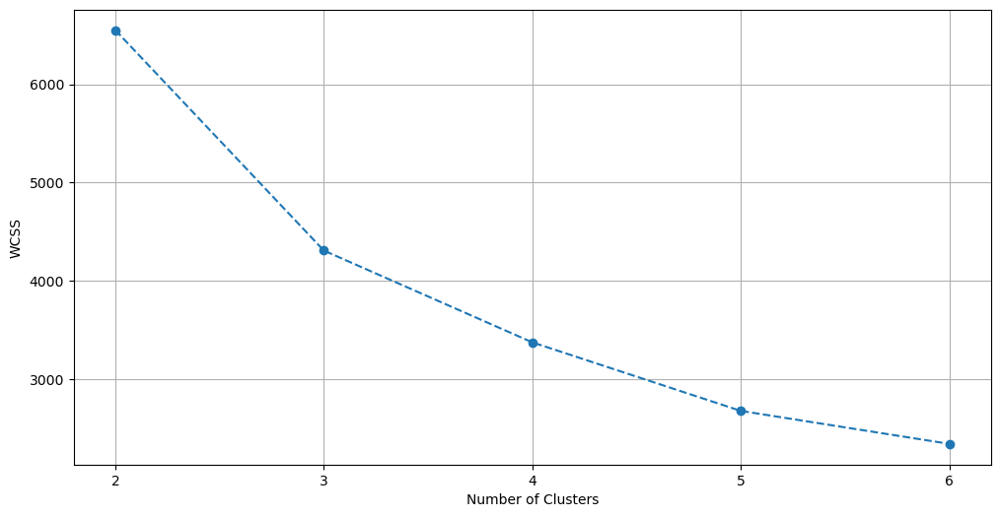

In [15]:
optimal_pca = PCA(n_components=3, svd_solver='full')
pca_data_train = optimal_pca.fit_transform(formatted_data)

# Display Variance Ratio and PCA Sensitivity for 3 PCs
df_variance_ratio = pd.DataFrame(np.array([optimal_pca.explained_variance_ratio_ * 100, optimal_pca.explained_variance_ratio_.cumsum() * 100]).transpose(), columns=['%Variance', '%CumulativeVariance'], index=['PC1', 'PC2', 'PC3'])
display(df_variance_ratio)

plot_pca_3components(optimal_pca.components_, extracted_data.columns)


min_clusters = 2
max_clusters = 6   
    
models, wcss = calculate_plot_wcss(pca_data_train, min_clusters, max_clusters)

In [16]:
def determine_optimal_k_wcss(wcss, max_clusters):
    wcss = np.array(wcss)
    k_range = range(2, max_clusters + 1)
    slope = (wcss[0] - wcss[-1]) / (k_range[0] - k_range[-1])
    intercept = wcss[0] - slope * k_range[0]
    y = k_range * slope + intercept
    optimal_k = k_range[(y - wcss).argmax()]
    return optimal_k

In [17]:
optimal_k = determine_optimal_k_wcss(wcss, max_clusters)
optimal_k

3

In [18]:
km = models[determine_optimal_k_wcss(wcss, max_clusters) - min_clusters]
km

KMeans(max_iter=10, n_clusters=3, n_init=2, random_state=0)

In [19]:
y_pred_train = km.labels_

y_pred_train

array([0, 0, 2, 2, 1, 0, 2, 2, 1, 2, 1, 2, 1, 1, 0, 1, 2, 0, 2, 1, 2, 2,
       0, 0, 0, 0, 1, 2, 1, 2, 1, 1, 2, 2, 0, 0, 1, 1, 2, 1, 1, 0, 2, 2,
       1, 2, 0, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 1, 0, 1, 2, 1, 2, 1, 0, 0,
       2, 0, 2, 0, 1, 2, 0, 2, 0, 1, 0, 2])

In [20]:
formatted_data, extracted_data = tsfresh_extract_features(test_df_3)

pca_data_test = optimal_pca.transform(formatted_data)

Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:07<00:00,  1.17s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.904788e-14,24.0,0.279414,-0.096743,-0.005585,0.134211,...,0.535961,0.535961,1.178655,1.657180,2.293452,2.718473,2.871476,2.890372,0.0,1.380878
1,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
2,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
3,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
4,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826
5,0.0,0.0,0.0,0.0,7.416290e-13,24.0,0.397261,0.123295,-0.001317,-0.254585,...,0.830518,1.303876,2.138397,1.540306,2.136507,2.510529,2.698011,2.813355,0.0,1.634657


In [21]:
y_pred_test = km.predict(pca_data_test)

y_pred_test

array([2, 1, 0, 0, 0, 0])

In [22]:
def plot_pca_clusters_2d(model, pca_data):
    
    for cluster in range(model.n_clusters):
#         cluster_points = pca_data[model.labels_ == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}")

    # Plot the cluster centroids as black 'X' markers
    ax.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1],
                color='black', marker='x', label='Centroids')

    plt.title("Clusters in PCA Space")
    ax.set_xlabel("Principal Component 1")
    ax.set_ylabel("Principal Component 2")
    ax.set_box_aspect(None, zoom=0.90)
    plt.legend()

    # Display the plot
    plt.show()
    
def plot_pca_clusters_3d(model, pca_data):
    
    # Prepare 3D graph
    fig = plt.figure(figsize=(12, 9), constrained_layout=True)
    ax = plt.axes(projection='3d')
    
    for cluster in range(model.n_clusters):
        cluster_points = pca_data[model.labels_ == cluster]
        # Plot 3D plot
        ax.scatter3D(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f"Cluster {cluster}")

    # Plot the cluster centroids as black 'X' markers
    ax.scatter3D(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1], model.cluster_centers_[:, 2],
                color='black', marker='x', label='Centroids')

    plt.title("Clusters in PCA Space")
    ax.set_xlabel("Principal Component 1")
    ax.set_ylabel("Principal Component 2")
    ax.set_zlabel("Principal Component 3", rotation=90)
    ax.set_box_aspect(None, zoom=0.90)
    ax.legend(labels=['Cluster 1', 'Cluster 2', 'Cluster 3', 'Centroids'])

    # Display the plot
    plt.show()

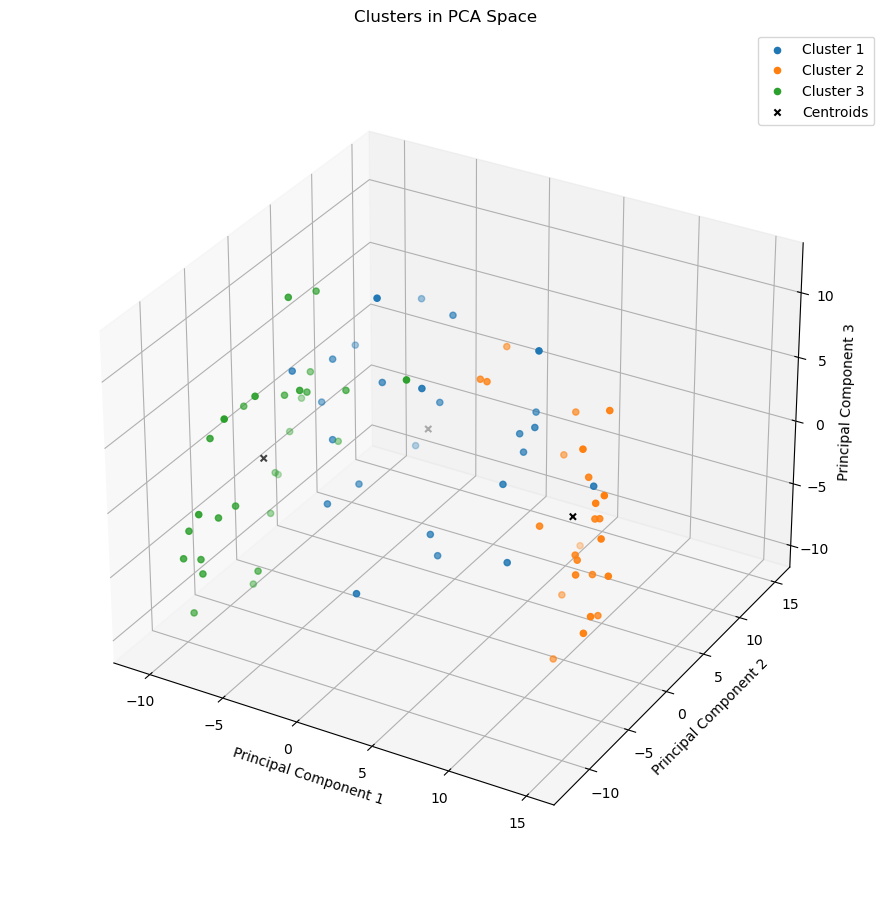

In [23]:
plot_pca_clusters_3d(km, pca_data_train)

#### Analyzing the fourth train test period

In [24]:
# Deeper analysis on the ith train test set
train_df_4, test_df_4 = generate_train_test_splits(df)[3]

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


In [25]:
formatted_data, extracted_data = tsfresh_extract_features(train_df_4)

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.82it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,1.896261e-13,24.0,0.201673,-0.129051,0.002027,0.464347,...,0.535961,0.793730,1.631345,1.578721,2.243619,2.501357,2.698011,2.813355,0.0,1.594400
1,1.0,0.0,0.0,0.0,1.394440e-13,24.0,0.433708,-0.094681,-0.014649,0.243460,...,0.687092,0.937156,2.351673,1.729346,2.623522,2.857103,2.944439,2.890372,0.0,1.403072
2,0.0,0.0,0.0,0.0,3.246292e-13,24.0,0.227536,0.122829,0.007731,-0.468421,...,0.687092,1.043794,2.031759,1.577489,2.197844,2.458204,2.520903,2.582306,0.0,1.579667
3,1.0,0.0,0.0,0.0,-1.743050e-13,24.0,0.323063,-0.068031,-0.000576,-0.196351,...,0.535961,0.535961,2.098147,1.400287,1.970827,2.314664,2.378620,2.443306,0.0,1.510660
4,0.0,0.0,0.0,0.0,-3.641532e-14,24.0,0.222375,0.127096,-0.003530,0.309669,...,0.271189,0.687092,1.043794,1.309991,1.974885,2.441215,2.652588,2.736339,0.0,1.434105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
74,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
75,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
76,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826


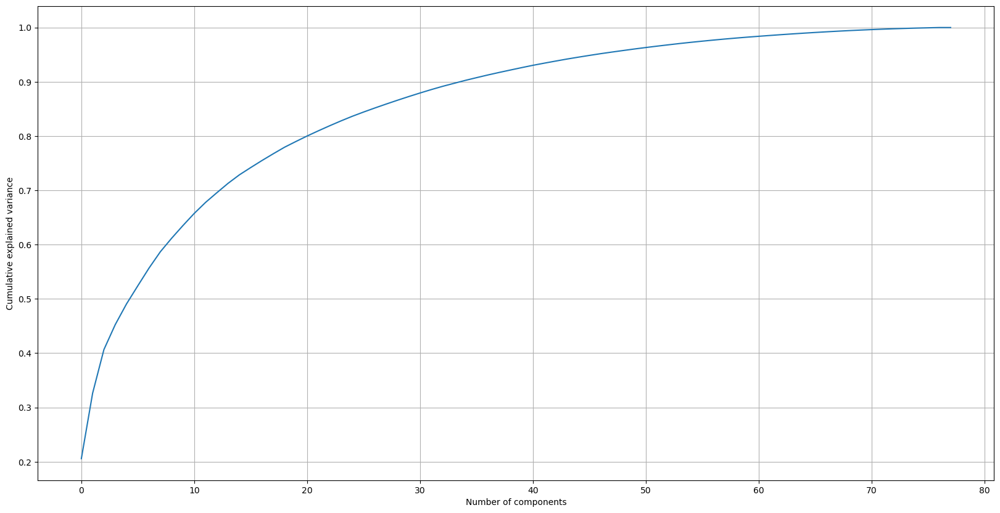

In [26]:
plot_pca_components(formatted_data)

,%Variance,%CumulativeVariance
PC1,20.568896,20.568896
PC2,12.067081,32.635976
PC3,8.029132,40.665108


Principal Component Values


,0,1,2,3,4,5,6,7,8,9,...,773,774,775,776,777,778,779,780,781,782
PC1,-0.025739,3.330669e-16,0.000000e+00,0.012392,-0.003027,-6.158268e-17,-0.044063,0.105633,-0.011058,-0.026801,...,-0.049305,-0.033699,-0.044433,-0.039695,-0.044173,-0.050739,-0.045823,-0.043125,0.0,-0.018508
PC2,-0.007800,-1.665335e-16,2.220446e-16,0.010330,0.007893,0.000000e+00,0.131918,0.033195,0.006757,-0.043607,...,0.103290,0.106193,0.093239,0.051439,0.063087,0.055397,0.053266,0.044919,0.0,0.066473
PC3,-0.031649,4.163336e-16,-5.551115e-17,0.004428,0.011652,-4.996004e-16,0.017890,0.019372,-0.008561,0.111700,...,-0.000944,0.011341,0.004645,0.003529,0.012998,0.012468,0.009612,0.017925,0.0,0.002424


Displaying Top N features based on sensitivity for each PC


,Top 1 Feature,Top 2 Feature,Top 3 Feature
PC1,"Close__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""mean""","Close__linear_trend__attr_""rvalue""","Close__linear_trend__attr_""slope"""
PC2,Close__absolute_sum_of_changes,"Close__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.0",Close__mean_abs_change
PC3,"Close__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","Close__cwt_coefficients__coeff_12__w_20__widths_(2, 5, 10, 20)","Close__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)"


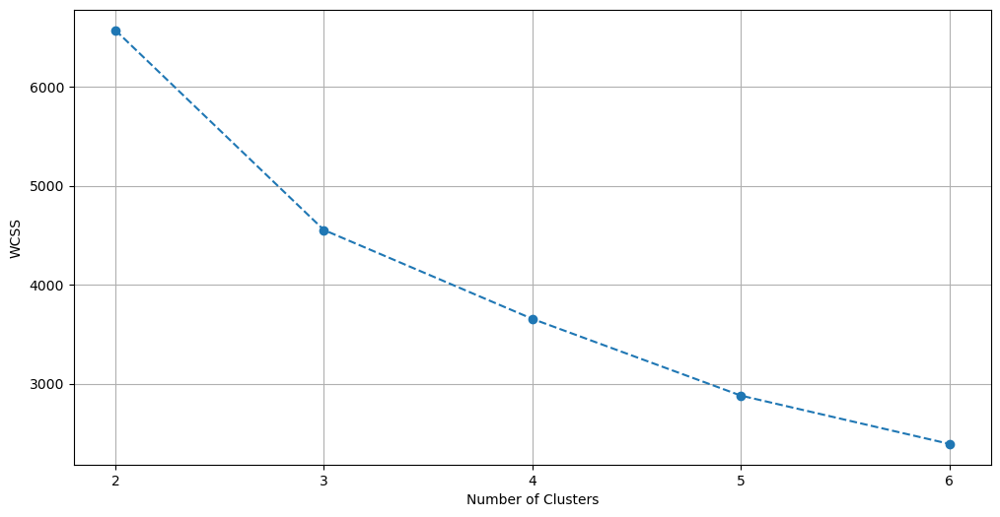

In [27]:
optimal_pca = PCA(n_components=3, svd_solver='full')
pca_data_train = optimal_pca.fit_transform(formatted_data)

# Display Variance Ratio and PCA Sensitivity for 3 PCs
df_variance_ratio = pd.DataFrame(np.array([optimal_pca.explained_variance_ratio_ * 100, optimal_pca.explained_variance_ratio_.cumsum() * 100]).transpose(), columns=['%Variance', '%CumulativeVariance'], index=['PC1', 'PC2', 'PC3'])
display(df_variance_ratio)

plot_pca_3components(optimal_pca.components_, extracted_data.columns)


min_clusters = 2
max_clusters = 6   
    
models, wcss = calculate_plot_wcss(pca_data_train, min_clusters, max_clusters)

In [28]:
km = models[determine_optimal_k_wcss(wcss, max_clusters) - min_clusters]
km

KMeans(max_iter=10, n_clusters=3, n_init=2, random_state=0)

In [29]:
y_pred_train = km.labels_

y_pred_train

array([1, 1, 2, 1, 2, 1, 2, 2, 0, 2, 1, 0, 1, 2, 1, 1, 0, 1, 0, 0, 2, 1,
       2, 1, 2, 2, 1, 1, 0, 0, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 0, 0, 2, 1,
       0, 0, 2, 1, 0, 2, 1, 2, 0, 2, 1, 2, 1, 2, 0, 0, 1, 1, 1, 0, 2, 1,
       0, 1, 0, 0, 0, 1, 1, 2, 0, 2, 2, 0])

In [30]:
formatted_data, extracted_data = tsfresh_extract_features(test_df_3)

pca_data_test = optimal_pca.transform(formatted_data)

Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.14s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.904788e-14,24.0,0.279414,-0.096743,-0.005585,0.134211,...,0.535961,0.535961,1.178655,1.657180,2.293452,2.718473,2.871476,2.890372,0.0,1.380878
1,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
2,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
3,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
4,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826
5,0.0,0.0,0.0,0.0,7.416290e-13,24.0,0.397261,0.123295,-0.001317,-0.254585,...,0.830518,1.303876,2.138397,1.540306,2.136507,2.510529,2.698011,2.813355,0.0,1.634657


In [31]:
y_pred_test = km.predict(pca_data_test)

y_pred_test

array([1, 2, 0, 2, 0, 0])

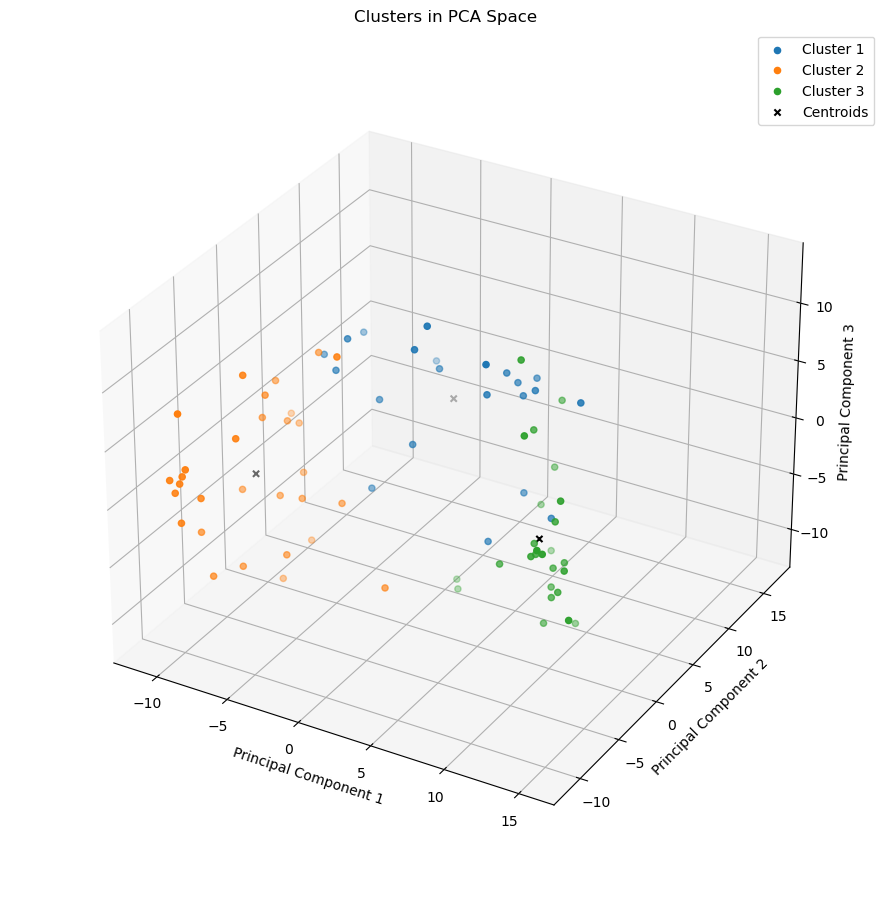

In [32]:
plot_pca_clusters_3d(km, pca_data_train)

### Applying the Analysis to all train-test periods for different n_components = 3 and >0.8

In [33]:
def df_transform_to_series(train_df, test_df):
    train_data = []
    Scaler = TimeSeriesScalerMeanVariance()

    for i in range(train_df.Week.nunique()):
        train_data.append(train_df.loc[train_df.Week == i].Close.to_numpy())
    
#     X_train = Scaler.fit_transform(train_data)
    
    test_data = []
    for i in range(test_df.Week.nunique()):
        test_data.append(test_df.loc[test_df.Week == i].Close.to_numpy())
    
#     X_test = Scaler.transform(test_data)
    
    return np.array(train_data), np.array(test_data)

In [34]:
def plot_pca_metrics(train_df, test_df, y_pred_train, y_pred_test, km, optimal_k, train_pca, test_pca):
    # Prep dataset
    X_train, X_test = df_transform_to_series(train_df, test_df)
    sz = X_train.shape[1]
    
    #Metrics
    print("Training Results")
    train_validation_index = ['wcss', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'silhouette_pca', 'calinski_harabasz_pca', 'davies_bouldin_pca']
    train_results = {vi: [] for vi in train_validation_index}

    for index in train_validation_index:
        if index == 'wcss':
            train_results[index].append(km.inertia_)
        else:
            train_results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, pca_features=train_pca))

    train_results_df = pd.DataFrame(train_results, index=[f"k={optimal_k}"])
    display(train_results_df)
    
    
    print("Testing Results")
    test_validation_index = ['wcss', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'silhouette_pca', 'calinski_harabasz_pca', 'davies_bouldin_pca']
    test_results = {vi: [] for vi in test_validation_index}

    for index in test_validation_index:
        if index == 'wcss':
            test_results[index].append(km.inertia_)
        else:
            test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, pca_features=test_pca))

    test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
    display(test_results_df)

    #Plotting
    subplot_index = 1
    plt.figure(figsize=(12, 9))

    for yi in range(optimal_k):
        plt.subplot(2, optimal_k, subplot_index + yi)
        for xx in X_train[y_pred_train == yi]:
            plt.plot(xx.ravel(), "k-", alpha=.2)
    #     plt.plot(km.cluster_centers_[yi].ravel(), "r-")
        plt.xlim(0, sz)
        plt.ylim(-4, 4)
        plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
                 transform=plt.gca().transAxes)
        if yi == optimal_k//2:
            plt.title("DBA $k$-means (Training)")
    subplot_index += optimal_k

    for yi in range(optimal_k):
        plt.subplot(2, optimal_k, subplot_index + yi)
        for xx in X_test[y_pred_test == yi]:
            plt.plot(xx.ravel(), "k-", alpha=.2)
    #     plt.plot(km.cluster_centers_[yi].ravel(), "r-")
        plt.xlim(0, sz)
        plt.ylim(-4, 4)
        plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
                 transform=plt.gca().transAxes)
        if yi == optimal_k//2:
            plt.title("DBA $k$-means (Testing)")
    subplot_index += optimal_k

    plt.tight_layout()
    plt.show()

In [35]:
def compute_sklearn_metrics(X, labels, scoring, metric=None, labels_true=None, km=None, X_train=None, pca_features=None):
    if X.size == 0 or labels.size == 0 or not scoring:
        print('Missing Parameters')
        return
    
    # Transform X for sklearn 
    X_ = to_time_series_dataset(X)
    X_ = X_.reshape((X.shape[0],-1))
    
    if scoring == 'silhouette':
        if metric == 'dtw':
            return silhouette_score(cdist_dtw(X_), labels, metric='precomputed')
        elif metric == 'softdtw':
            # Add gamma parameter if necessary
            return silhouette_score(cdist_soft_dtw_normalized(X_, gamma=0.01), labels, metric='precomputed')
        else:
            return silhouette_score(X_, labels)
    elif scoring == 'silhouette_pca':
        return silhouette_score(pca_features, labels)
    else:
        if scoring == 'calinski_harabasz':
            return calinski_harabasz_score(X_, labels)
        elif scoring == 'calinski_harabasz_pca':
            return calinski_harabasz_score(pca_features, labels)
        elif scoring == 'calinski_harabasz_dtw':
            return calinski_harabasz_score_dtw(X_, labels, km)
        elif scoring == 'davies_bouldin':
            return davies_bouldin_score(X_, labels)
        elif scoring == 'davies_bouldin_pca':
            return davies_bouldin_score(pca_features, labels)
        elif scoring == 'davies_bouldin_dtw':
            return davies_bouldin_score_dtw(X_, labels, km)
        elif scoring == 'davies_bouldin_medoids':
            return davies_bouldin_score_medoids(X_, labels, km, X_train)
        elif scoring == 'davies_bouldin_medoids_dtw':
            return davies_bouldin_score_medoids(X_, labels, km, X_train, dtw=True)   
        elif scoring == 'v_measure_score':
            return v_measure_score(labels_true, labels)

In [36]:
def generate_train_test_split_results(df, n_components, predefined_k=None):
    pred_results = []
    df = df.reset_index()
    
    tscv = TimeBasedCV(train_period=78, test_period=6, freq='weeks')
    min_clusters = 2
    max_clusters = 6
    
    for train_index, test_index in tscv.split(df, date_column='Datetime'):
        X_train_full = df.loc[train_index]
        X_train_full.set_index("Datetime", inplace = True)
        X_test_full = df.loc[test_index]
        X_test_full.set_index("Datetime", inplace = True)
        X_train, X_test = process_data(X_train_full, X_test_full)

        train_pca_data, _ = tsfresh_extract_features(X_train)
        test_pca_data, _ = tsfresh_extract_features(X_test)
        
        optimal_pca = PCA(n_components=n_components, svd_solver='full')
        train_pca_data = optimal_pca.fit_transform(train_pca_data)
        models, wcss = calculate_plot_wcss(train_pca_data, min_clusters, max_clusters)
        
        if not predefined_k:
            print("Determining optimal_k...")
            optimal_k = determine_optimal_k_wcss(wcss, max_clusters)
        else:
            optimal_k = predefined_k
        
        print(f"Optimal k is found to be {optimal_k}")
        km = models[optimal_k - min_clusters]
        y_pred_train = km.labels_
        
        test_pca_data = optimal_pca.transform(test_pca_data)
        y_pred_test = km.predict(test_pca_data)
        pred_results.append((y_pred_train, y_pred_test))
        
        plot_pca_metrics(X_train, X_test, y_pred_train, y_pred_test, km, optimal_k, train_pca_data, test_pca_data)
        
        
    return pred_results

#### n_components = 3

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.37it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-2.140510e-13,24.0,0.419473,0.053397,-0.020716,-0.082317,...,0.793730,0.793730,1.517152,1.306844,1.838799,2.293413,2.579625,2.707270,0.0,1.561852
1,0.0,0.0,0.0,0.0,6.084022e-14,24.0,0.321532,-0.091977,0.004883,-0.139878,...,0.793730,0.793730,1.285293,1.468140,2.243619,2.649159,2.871476,2.890372,0.0,1.620558
2,0.0,0.0,0.0,0.0,-4.407585e-14,24.0,0.386569,-0.055142,-0.013821,-0.008060,...,0.535961,0.793730,1.732659,1.531967,2.263858,2.524058,2.652588,2.707270,0.0,1.485976
3,0.0,0.0,0.0,0.0,-5.517808e-14,24.0,0.326490,0.015070,0.017946,0.039334,...,0.793730,0.793730,1.043794,1.581363,2.265239,2.649159,2.770974,2.813355,0.0,1.535919
4,0.0,0.0,0.0,0.0,3.743672e-13,24.0,0.642222,-0.011652,-0.012727,-0.046950,...,0.687092,1.178655,1.951260,1.680460,2.425480,2.692311,2.871476,2.890372,0.0,1.389067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-4.884981e-14,24.0,0.240896,0.108922,0.005964,-0.208100,...,0.271189,0.535961,2.031759,1.641230,2.359466,2.787788,2.798513,2.813355,0.0,1.612914
74,1.0,0.0,0.0,0.0,-3.363976e-13,24.0,0.382289,-0.104666,-0.019780,0.052481,...,1.031767,1.377820,2.098147,1.620593,2.466577,2.787788,2.944439,2.890372,0.0,1.345687
75,0.0,0.0,0.0,0.0,6.461498e-14,24.0,0.185084,0.102253,0.003431,0.272446,...,0.271189,0.271189,1.303876,1.364204,1.897368,2.289952,2.625048,2.813355,0.0,1.341862
76,0.0,0.0,0.0,0.0,1.083578e-13,24.0,0.405061,0.064018,-0.015402,0.099829,...,0.687092,0.793730,1.732659,1.427679,2.111590,2.622996,2.871476,2.890372,0.0,1.563839


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.08s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,-3.796963e-13,24.0,0.306347,-0.133997,-0.003480,-0.349153,...,0.535961,0.535961,1.839297,1.657180,2.334549,2.857103,2.944439,2.890372,0.0,1.364258
1,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
2,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
3,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
4,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994
5,0.0,0.0,0.0,0.0,-1.013412e-12,24.0,0.343735,-0.090558,0.003112,-0.352405,...,0.535961,0.937156,2.204785,1.526775,2.131830,2.524058,2.698011,2.813355,0.0,1.612140


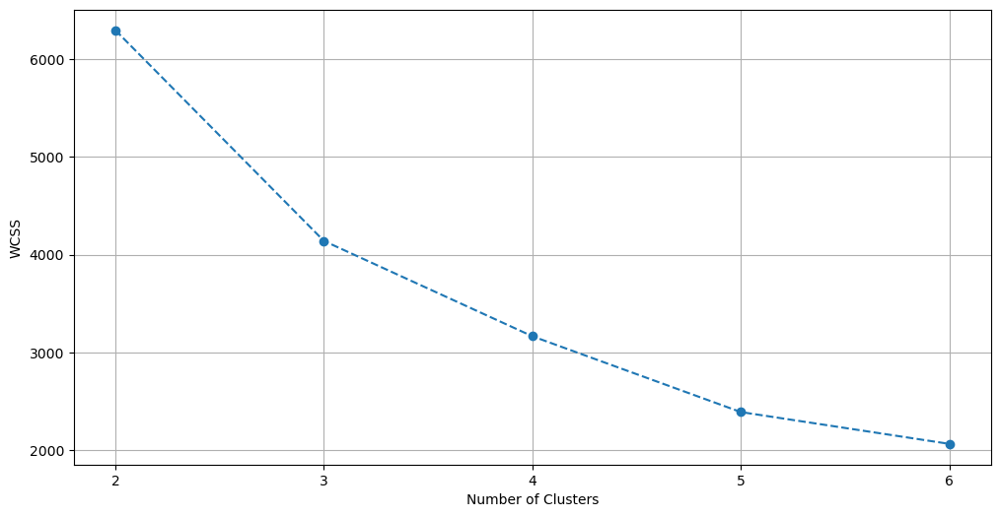

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4140.62499,0.248148,23.627535,2.153723,0.333774,64.545065,0.982209


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4140.62499,0.118099,3.148967,0.930106,0.091689,4.423078,0.64308


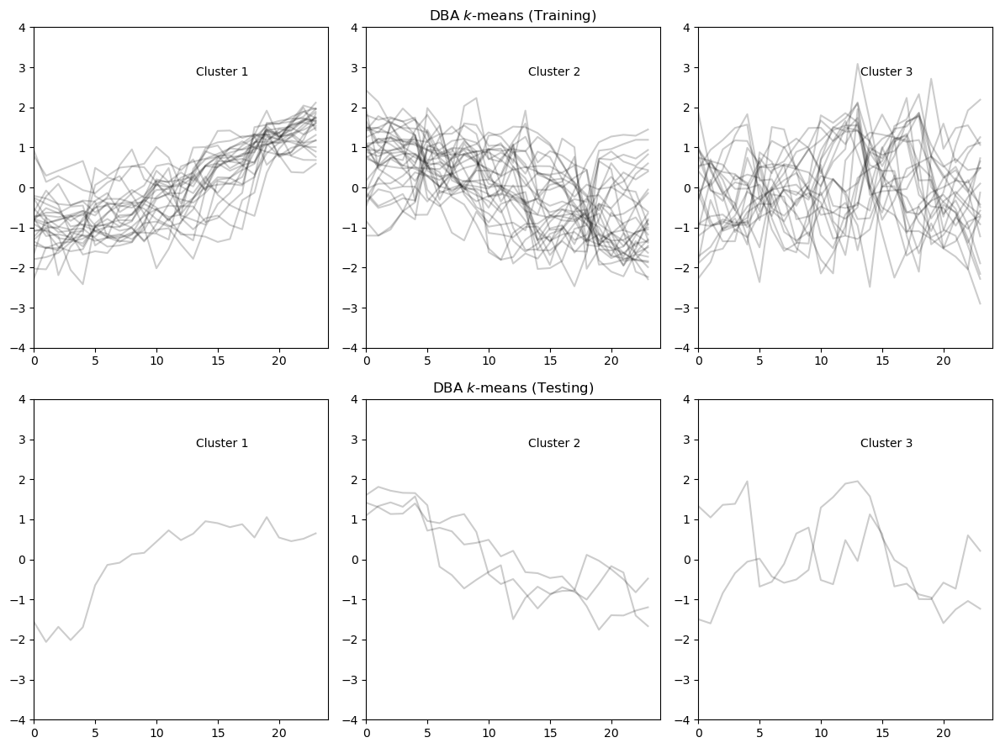

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.26it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,2.065015e-13,24.0,0.239640,0.108974,0.007723,0.163207,...,0.271189,0.271189,1.671595,1.373004,2.029396,2.524058,2.652588,2.707270,0.0,1.449096
1,0.0,0.0,0.0,0.0,-5.617729e-13,24.0,0.487631,0.152095,-0.005901,0.208599,...,0.535961,0.793730,1.884871,1.680460,2.359466,2.692311,2.871476,2.890372,0.0,1.565684
2,0.0,0.0,0.0,0.0,1.045830e-13,24.0,0.335758,0.000601,0.016697,0.241685,...,0.535961,0.793730,1.484458,1.567236,2.397267,2.718473,2.770974,2.813355,0.0,1.426338
3,0.0,0.0,0.0,0.0,4.498624e-13,24.0,0.306370,-0.080594,-0.008853,-0.224293,...,0.687092,0.793730,1.410514,1.707390,2.516410,2.857103,2.944439,2.890372,0.0,1.405955
4,0.0,0.0,0.0,0.0,3.719247e-13,24.0,0.636021,-0.124546,-0.011186,0.212779,...,0.687092,1.178655,1.692409,1.546599,2.146095,2.484367,2.770974,2.813355,0.0,1.591291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
74,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
75,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
76,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.06s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.656098e-13,24.0,0.540308,-0.084657,0.000635,-0.012983,...,0.937156,1.303876,2.311423,1.656676,2.557508,2.787788,2.944439,2.890372,0.0,1.648566
1,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
2,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
3,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
4,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417
5,0.0,0.0,0.0,0.0,4.440892e-16,24.0,0.230265,-0.124036,-0.007623,0.234123,...,0.271189,0.271189,1.377820,1.516522,2.372350,2.830940,2.944439,2.890372,0.0,1.491655


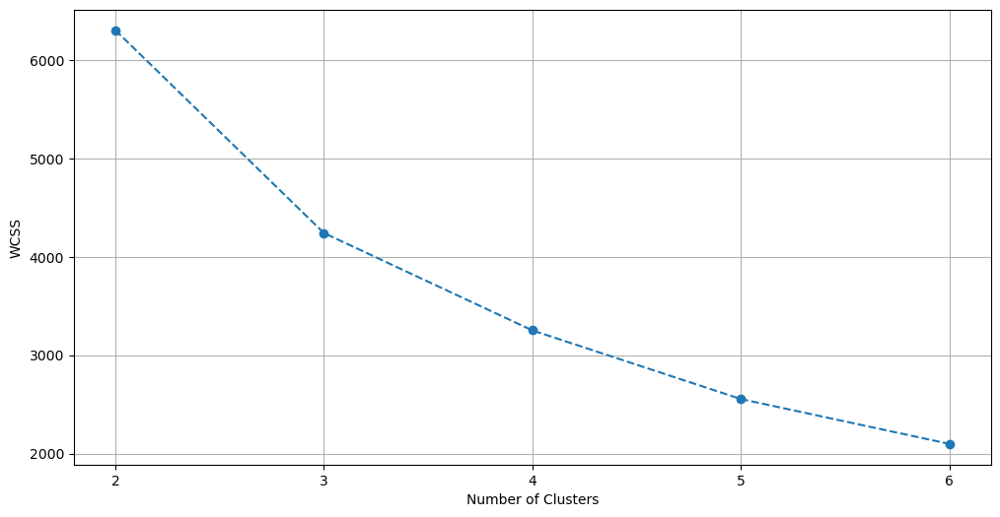

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4242.1843,0.282162,28.079804,2.067411,0.335057,64.19679,0.98364


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4242.1843,0.230149,2.183119,0.827457,0.334465,6.196497,0.526569


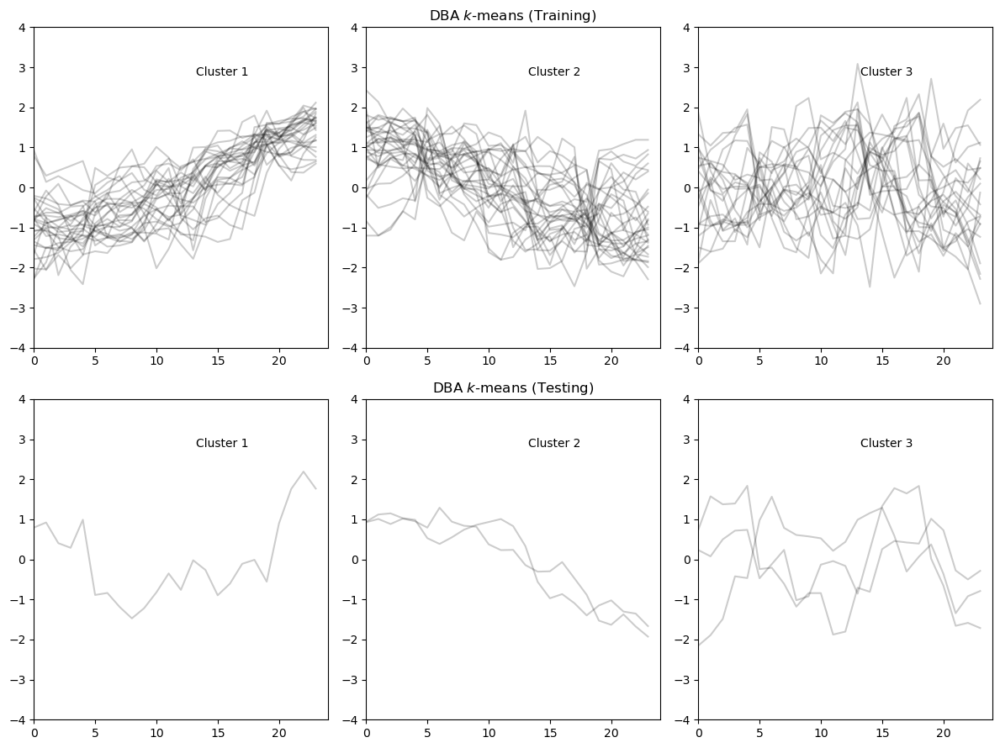

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.46it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,5.018208e-13,24.0,0.621284,-0.117071,-0.010043,0.013040,...,1.072017,1.285293,1.925121,1.576898,2.318368,2.787788,2.944439,2.890372,0.0,1.640659
1,1.0,0.0,0.0,0.0,-8.615331e-14,24.0,0.592768,-0.033562,0.033783,0.024077,...,1.072017,1.418069,2.351673,1.708708,2.375647,2.926418,2.944439,2.890372,0.0,1.551195
2,0.0,0.0,0.0,0.0,6.150636e-14,24.0,0.484463,-0.010443,0.011137,0.481173,...,0.687092,1.178655,2.057898,1.571197,2.334549,2.857103,2.871476,2.890372,0.0,1.506075
3,1.0,0.0,0.0,0.0,-1.709743e-13,24.0,0.302137,-0.068818,0.022547,-0.138479,...,0.535961,0.535961,1.178655,1.518350,2.265239,2.649159,2.770974,2.813355,0.0,1.483494
4,0.0,0.0,0.0,0.0,1.256772e-13,24.0,0.247025,0.117478,-0.001461,-0.464381,...,0.271189,0.535961,1.285293,1.112021,1.659081,2.037405,2.287773,2.428274,0.0,1.519176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
74,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
75,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
76,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.10s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.904788e-14,24.0,0.279414,-0.096743,-0.005585,0.134211,...,0.535961,0.535961,1.178655,1.657180,2.293452,2.718473,2.871476,2.890372,0.0,1.380878
1,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
2,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
3,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
4,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826
5,0.0,0.0,0.0,0.0,7.416290e-13,24.0,0.397261,0.123295,-0.001317,-0.254585,...,0.830518,1.303876,2.138397,1.540306,2.136507,2.510529,2.698011,2.813355,0.0,1.634657


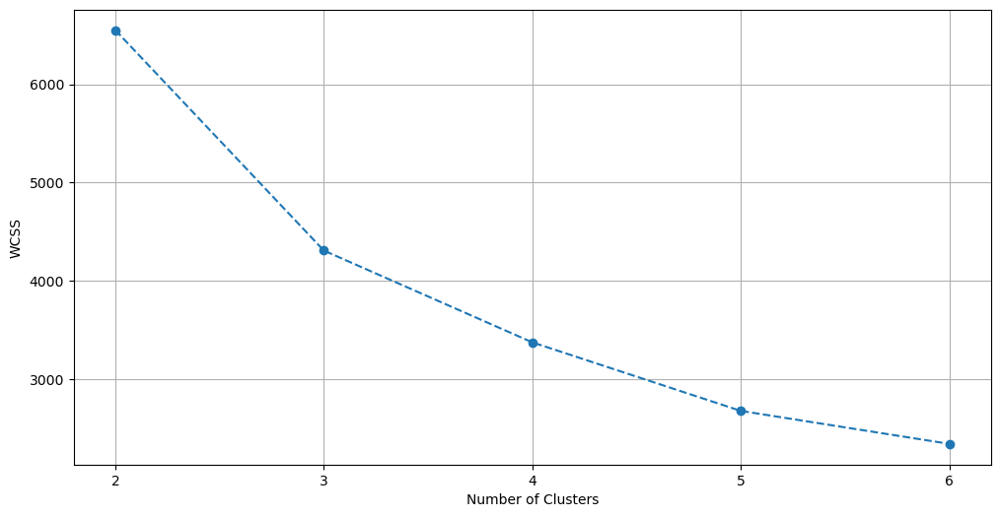

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4306.650264,0.285215,28.385379,1.834428,0.326026,62.853717,0.984921


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4306.650264,-0.094461,2.110852,0.916179,0.213313,5.193379,0.350382


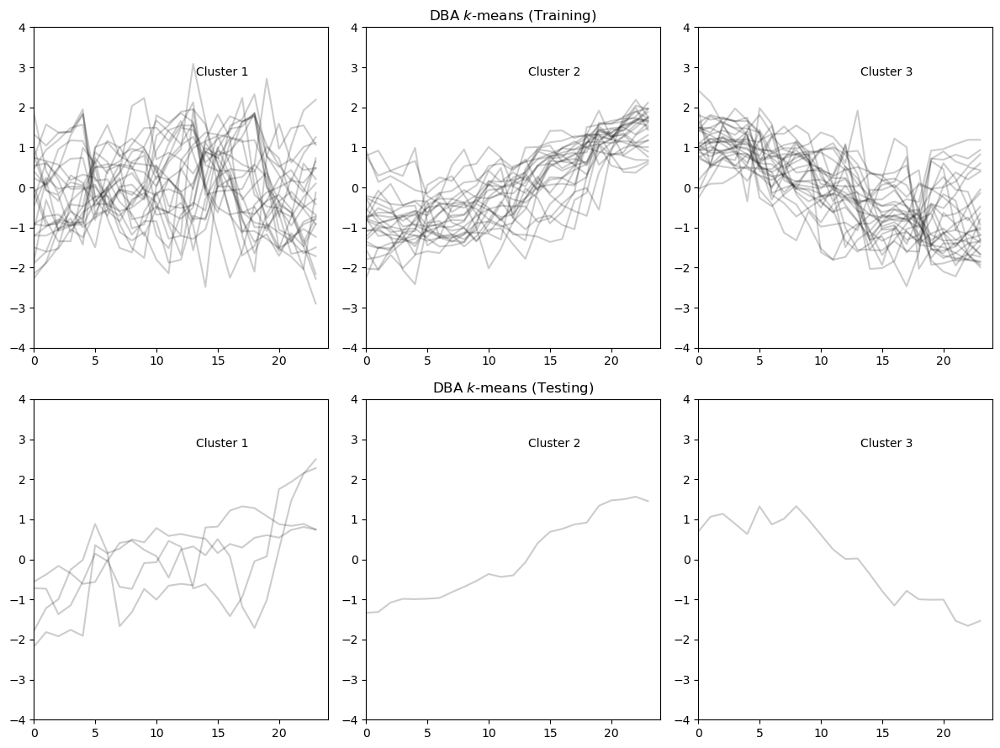

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.78it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,1.896261e-13,24.0,0.201673,-0.129051,0.002027,0.464347,...,0.535961,0.793730,1.631345,1.578721,2.243619,2.501357,2.698011,2.813355,0.0,1.594400
1,1.0,0.0,0.0,0.0,1.394440e-13,24.0,0.433708,-0.094681,-0.014649,0.243460,...,0.687092,0.937156,2.351673,1.729346,2.623522,2.857103,2.944439,2.890372,0.0,1.403072
2,0.0,0.0,0.0,0.0,3.246292e-13,24.0,0.227536,0.122829,0.007731,-0.468421,...,0.687092,1.043794,2.031759,1.577489,2.197844,2.458204,2.520903,2.582306,0.0,1.579667
3,1.0,0.0,0.0,0.0,-1.743050e-13,24.0,0.323063,-0.068031,-0.000576,-0.196351,...,0.535961,0.535961,2.098147,1.400287,1.970827,2.314664,2.378620,2.443306,0.0,1.510660
4,0.0,0.0,0.0,0.0,-3.641532e-14,24.0,0.222375,0.127096,-0.003530,0.309669,...,0.271189,0.687092,1.043794,1.309991,1.974885,2.441215,2.652588,2.736339,0.0,1.434105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
74,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
75,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
76,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.15s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,6.568079e-13,24.0,0.362205,0.148735,-0.012228,-0.350958,...,0.793730,1.043794,2.204785,1.492738,2.309633,2.692311,2.798513,2.890372,0.0,1.560885
1,0.0,0.0,0.0,0.0,-2.255973e-13,24.0,0.162353,0.109294,0.000665,-0.239022,...,0.535961,0.535961,1.410514,1.222602,1.656454,2.094641,2.378620,2.443306,0.0,1.260538
2,1.0,0.0,0.0,0.0,-2.547962e-13,24.0,0.556319,0.040252,0.001525,0.161798,...,0.687092,1.263626,2.351673,1.562044,2.595309,2.857103,2.944439,2.890372,0.0,1.518300
3,0.0,0.0,0.0,0.0,2.429390e-12,24.0,0.494184,0.019648,-0.004418,-0.065238,...,0.793730,1.043794,2.098147,1.684924,2.516410,2.857103,2.944439,2.890372,0.0,1.578973
4,0.0,0.0,0.0,0.0,-2.158274e-13,24.0,0.532661,-0.101884,0.002404,-0.072318,...,0.535961,1.118969,2.098147,1.684924,2.598605,2.857103,2.871476,2.890372,0.0,1.550838
5,1.0,0.0,0.0,0.0,6.785683e-13,24.0,0.412636,0.152559,-0.005118,0.077436,...,1.303876,1.732659,2.031759,1.555751,2.238941,2.553682,2.770974,2.890372,0.0,1.487860


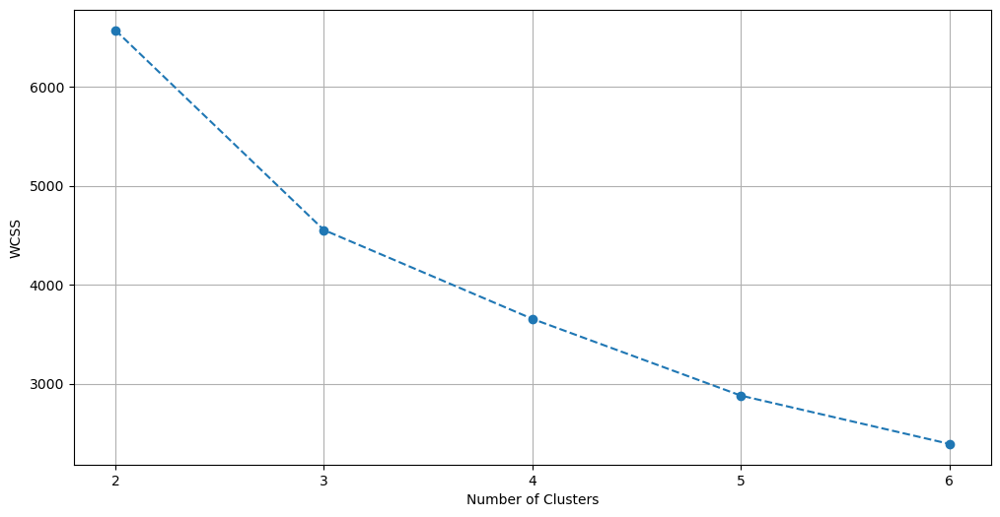

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4552.716862,0.267469,28.317326,2.024534,0.327551,57.860831,0.999277


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4552.716862,0.421603,2.398016,1.068603,0.346919,5.153914,0.46644


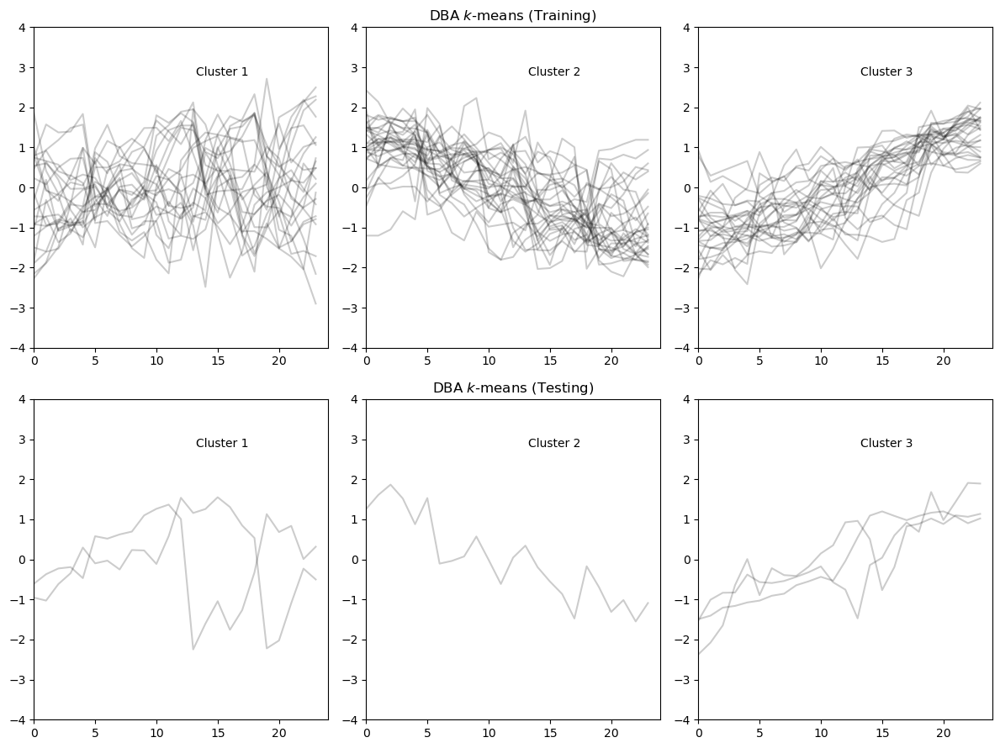

In [37]:
three_comp_pred_results = generate_train_test_split_results(df, n_components=3)

#### n_components = 0.8

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.89it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-2.140510e-13,24.0,0.419473,0.053397,-0.020716,-0.082317,...,0.793730,0.793730,1.517152,1.306844,1.838799,2.293413,2.579625,2.707270,0.0,1.561852
1,0.0,0.0,0.0,0.0,6.084022e-14,24.0,0.321532,-0.091977,0.004883,-0.139878,...,0.793730,0.793730,1.285293,1.468140,2.243619,2.649159,2.871476,2.890372,0.0,1.620558
2,0.0,0.0,0.0,0.0,-4.407585e-14,24.0,0.386569,-0.055142,-0.013821,-0.008060,...,0.535961,0.793730,1.732659,1.531967,2.263858,2.524058,2.652588,2.707270,0.0,1.485976
3,0.0,0.0,0.0,0.0,-5.517808e-14,24.0,0.326490,0.015070,0.017946,0.039334,...,0.793730,0.793730,1.043794,1.581363,2.265239,2.649159,2.770974,2.813355,0.0,1.535919
4,0.0,0.0,0.0,0.0,3.743672e-13,24.0,0.642222,-0.011652,-0.012727,-0.046950,...,0.687092,1.178655,1.951260,1.680460,2.425480,2.692311,2.871476,2.890372,0.0,1.389067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-4.884981e-14,24.0,0.240896,0.108922,0.005964,-0.208100,...,0.271189,0.535961,2.031759,1.641230,2.359466,2.787788,2.798513,2.813355,0.0,1.612914
74,1.0,0.0,0.0,0.0,-3.363976e-13,24.0,0.382289,-0.104666,-0.019780,0.052481,...,1.031767,1.377820,2.098147,1.620593,2.466577,2.787788,2.944439,2.890372,0.0,1.345687
75,0.0,0.0,0.0,0.0,6.461498e-14,24.0,0.185084,0.102253,0.003431,0.272446,...,0.271189,0.271189,1.303876,1.364204,1.897368,2.289952,2.625048,2.813355,0.0,1.341862
76,0.0,0.0,0.0,0.0,1.083578e-13,24.0,0.405061,0.064018,-0.015402,0.099829,...,0.687092,0.793730,1.732659,1.427679,2.111590,2.622996,2.871476,2.890372,0.0,1.563839


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.15s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,-3.796963e-13,24.0,0.306347,-0.133997,-0.003480,-0.349153,...,0.535961,0.535961,1.839297,1.657180,2.334549,2.857103,2.944439,2.890372,0.0,1.364258
1,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
2,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
3,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
4,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994
5,0.0,0.0,0.0,0.0,-1.013412e-12,24.0,0.343735,-0.090558,0.003112,-0.352405,...,0.535961,0.937156,2.204785,1.526775,2.131830,2.524058,2.698011,2.813355,0.0,1.612140


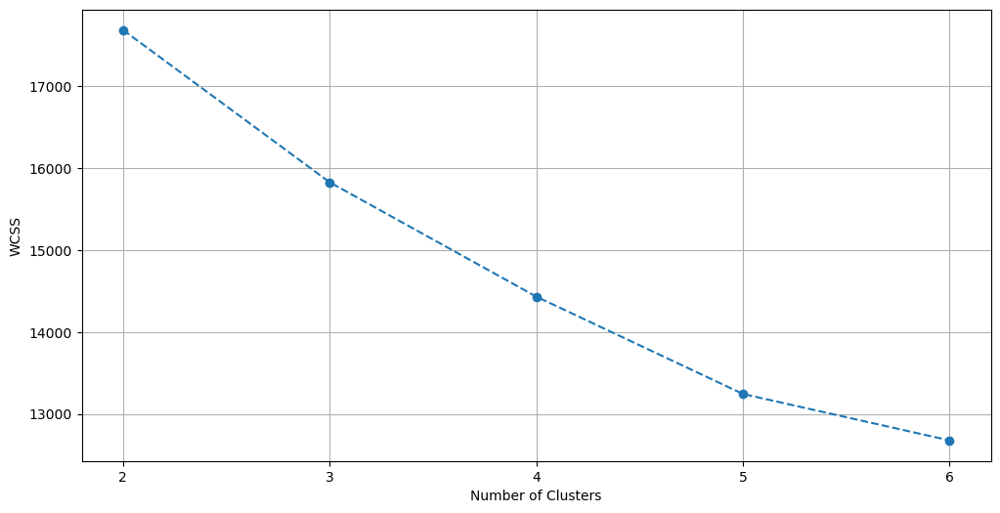

Determining optimal_k...
Optimal k is found to be 4
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,14432.205788,0.250674,23.389531,1.803029,0.154499,14.171651,2.066027


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,14432.205788,-0.146795,1.790828,0.824678,-0.099341,1.811929,0.825462


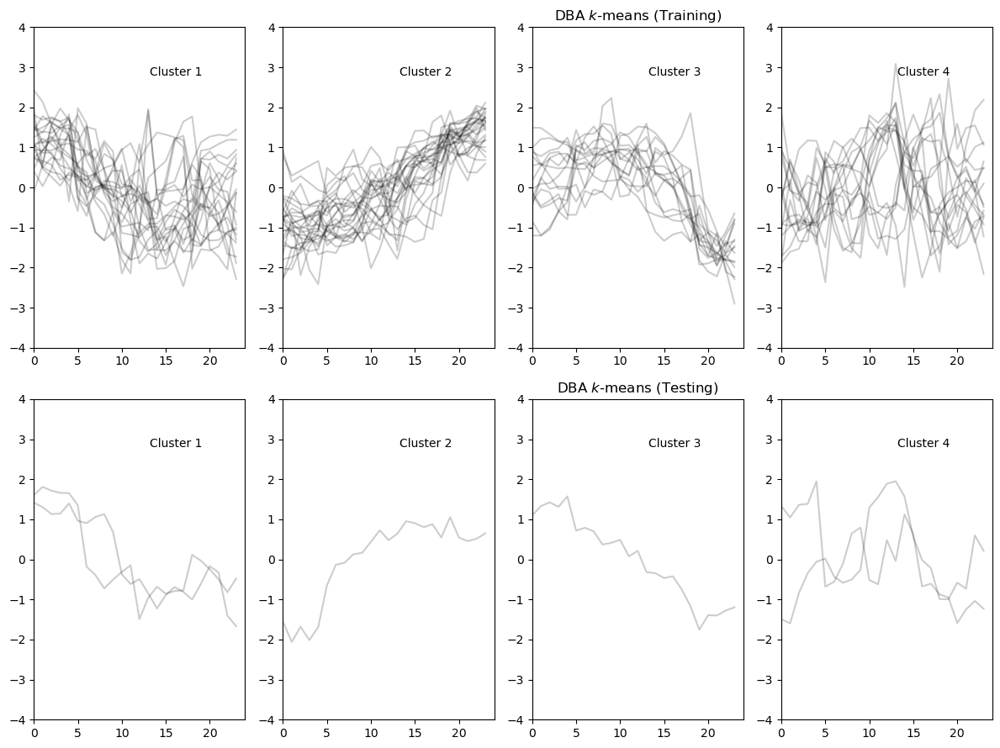

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.95it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,2.065015e-13,24.0,0.239640,0.108974,0.007723,0.163207,...,0.271189,0.271189,1.671595,1.373004,2.029396,2.524058,2.652588,2.707270,0.0,1.449096
1,0.0,0.0,0.0,0.0,-5.617729e-13,24.0,0.487631,0.152095,-0.005901,0.208599,...,0.535961,0.793730,1.884871,1.680460,2.359466,2.692311,2.871476,2.890372,0.0,1.565684
2,0.0,0.0,0.0,0.0,1.045830e-13,24.0,0.335758,0.000601,0.016697,0.241685,...,0.535961,0.793730,1.484458,1.567236,2.397267,2.718473,2.770974,2.813355,0.0,1.426338
3,0.0,0.0,0.0,0.0,4.498624e-13,24.0,0.306370,-0.080594,-0.008853,-0.224293,...,0.687092,0.793730,1.410514,1.707390,2.516410,2.857103,2.944439,2.890372,0.0,1.405955
4,0.0,0.0,0.0,0.0,3.719247e-13,24.0,0.636021,-0.124546,-0.011186,0.212779,...,0.687092,1.178655,1.692409,1.546599,2.146095,2.484367,2.770974,2.813355,0.0,1.591291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
74,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
75,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
76,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.11s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.656098e-13,24.0,0.540308,-0.084657,0.000635,-0.012983,...,0.937156,1.303876,2.311423,1.656676,2.557508,2.787788,2.944439,2.890372,0.0,1.648566
1,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
2,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
3,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
4,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417
5,0.0,0.0,0.0,0.0,4.440892e-16,24.0,0.230265,-0.124036,-0.007623,0.234123,...,0.271189,0.271189,1.377820,1.516522,2.372350,2.830940,2.944439,2.890372,0.0,1.491655


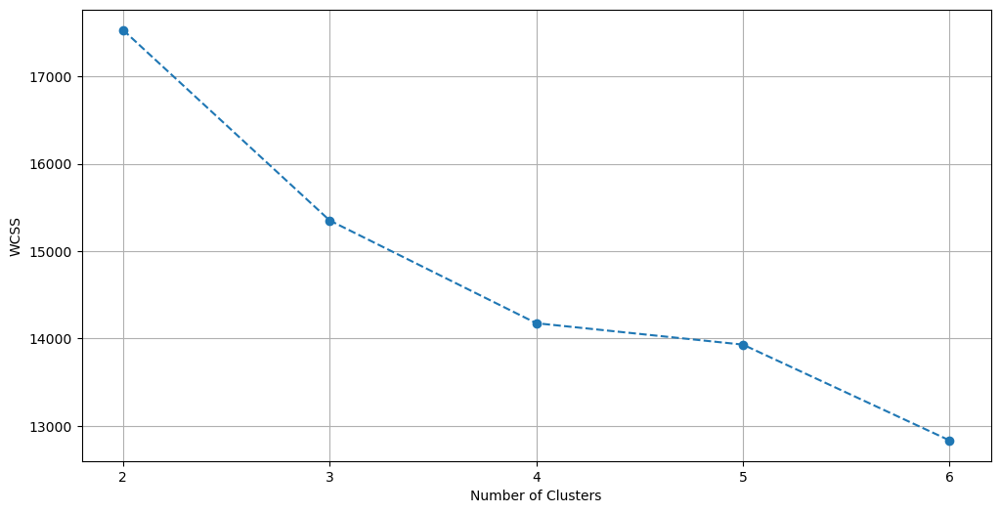

Determining optimal_k...
Optimal k is found to be 4
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,14174.52053,0.259863,25.435446,1.871605,0.172247,14.91411,1.872173


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,14174.52053,0.18708,1.606406,1.315592,0.325801,3.377076,1.090727


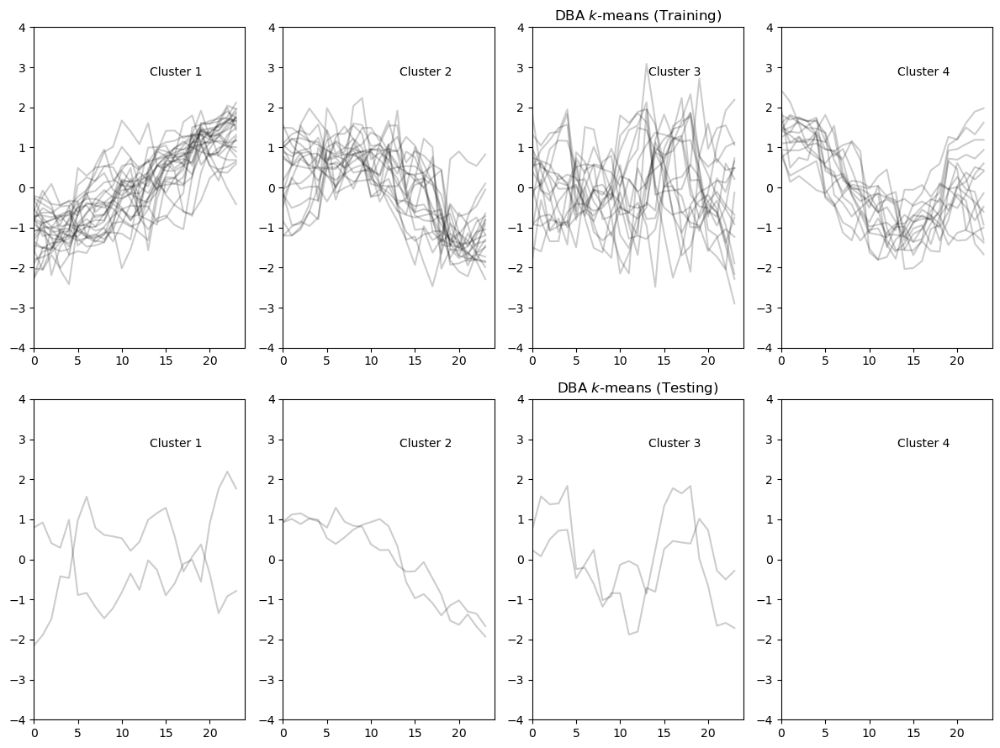

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.35it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,5.018208e-13,24.0,0.621284,-0.117071,-0.010043,0.013040,...,1.072017,1.285293,1.925121,1.576898,2.318368,2.787788,2.944439,2.890372,0.0,1.640659
1,1.0,0.0,0.0,0.0,-8.615331e-14,24.0,0.592768,-0.033562,0.033783,0.024077,...,1.072017,1.418069,2.351673,1.708708,2.375647,2.926418,2.944439,2.890372,0.0,1.551195
2,0.0,0.0,0.0,0.0,6.150636e-14,24.0,0.484463,-0.010443,0.011137,0.481173,...,0.687092,1.178655,2.057898,1.571197,2.334549,2.857103,2.871476,2.890372,0.0,1.506075
3,1.0,0.0,0.0,0.0,-1.709743e-13,24.0,0.302137,-0.068818,0.022547,-0.138479,...,0.535961,0.535961,1.178655,1.518350,2.265239,2.649159,2.770974,2.813355,0.0,1.483494
4,0.0,0.0,0.0,0.0,1.256772e-13,24.0,0.247025,0.117478,-0.001461,-0.464381,...,0.271189,0.535961,1.285293,1.112021,1.659081,2.037405,2.287773,2.428274,0.0,1.519176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
74,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
75,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
76,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.11s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.904788e-14,24.0,0.279414,-0.096743,-0.005585,0.134211,...,0.535961,0.535961,1.178655,1.657180,2.293452,2.718473,2.871476,2.890372,0.0,1.380878
1,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
2,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
3,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
4,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826
5,0.0,0.0,0.0,0.0,7.416290e-13,24.0,0.397261,0.123295,-0.001317,-0.254585,...,0.830518,1.303876,2.138397,1.540306,2.136507,2.510529,2.698011,2.813355,0.0,1.634657


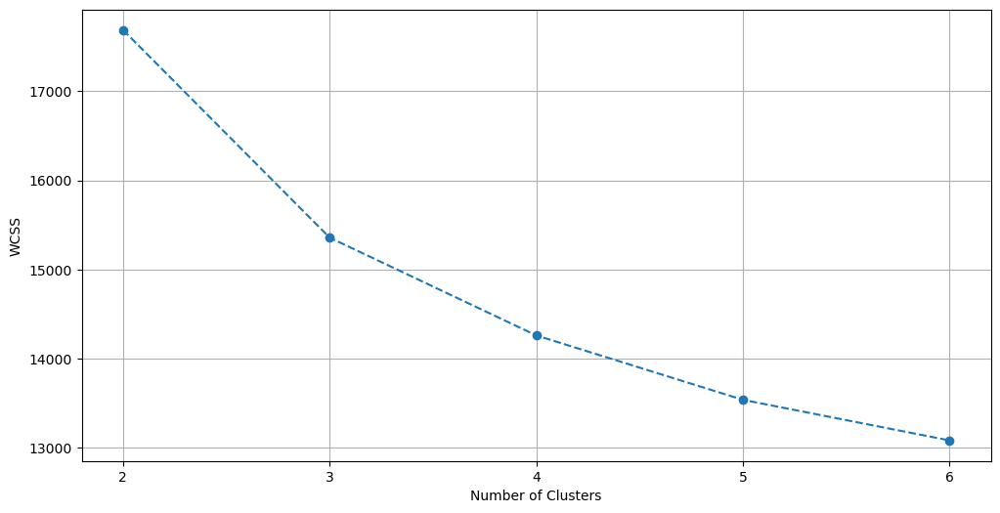

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15357.818168,0.294737,29.360258,1.927932,0.221596,17.879961,1.945203


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15357.818168,0.136303,2.458493,1.336116,0.180749,2.608084,0.952198


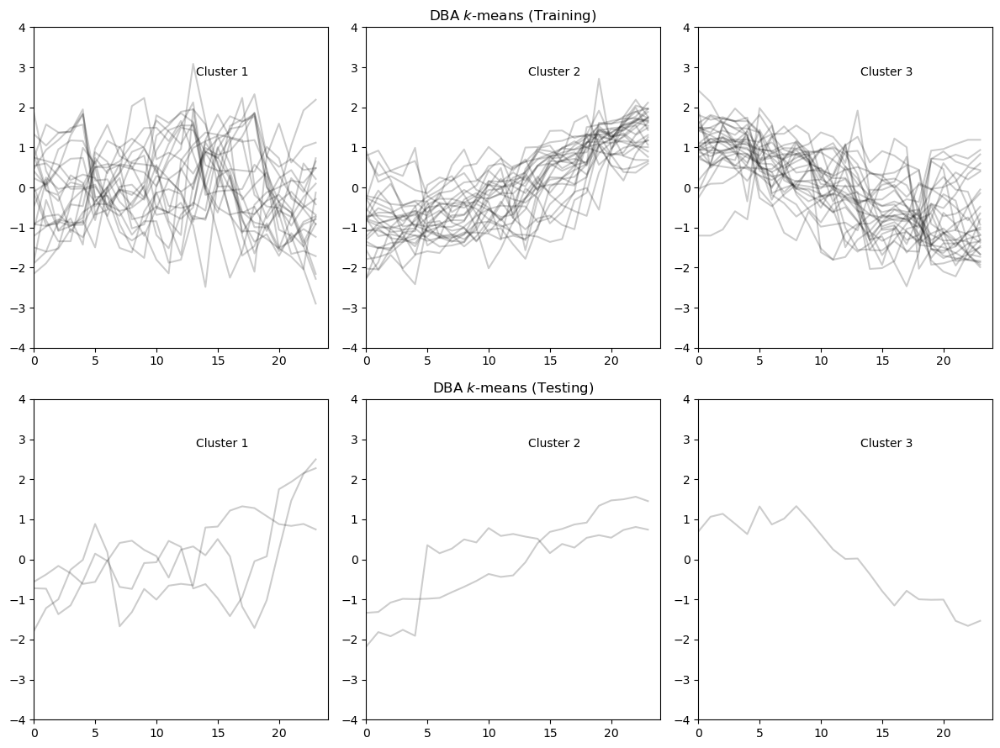

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.22it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,1.896261e-13,24.0,0.201673,-0.129051,0.002027,0.464347,...,0.535961,0.793730,1.631345,1.578721,2.243619,2.501357,2.698011,2.813355,0.0,1.594400
1,1.0,0.0,0.0,0.0,1.394440e-13,24.0,0.433708,-0.094681,-0.014649,0.243460,...,0.687092,0.937156,2.351673,1.729346,2.623522,2.857103,2.944439,2.890372,0.0,1.403072
2,0.0,0.0,0.0,0.0,3.246292e-13,24.0,0.227536,0.122829,0.007731,-0.468421,...,0.687092,1.043794,2.031759,1.577489,2.197844,2.458204,2.520903,2.582306,0.0,1.579667
3,1.0,0.0,0.0,0.0,-1.743050e-13,24.0,0.323063,-0.068031,-0.000576,-0.196351,...,0.535961,0.535961,2.098147,1.400287,1.970827,2.314664,2.378620,2.443306,0.0,1.510660
4,0.0,0.0,0.0,0.0,-3.641532e-14,24.0,0.222375,0.127096,-0.003530,0.309669,...,0.271189,0.687092,1.043794,1.309991,1.974885,2.441215,2.652588,2.736339,0.0,1.434105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
74,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
75,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
76,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.10s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,6.568079e-13,24.0,0.362205,0.148735,-0.012228,-0.350958,...,0.793730,1.043794,2.204785,1.492738,2.309633,2.692311,2.798513,2.890372,0.0,1.560885
1,0.0,0.0,0.0,0.0,-2.255973e-13,24.0,0.162353,0.109294,0.000665,-0.239022,...,0.535961,0.535961,1.410514,1.222602,1.656454,2.094641,2.378620,2.443306,0.0,1.260538
2,1.0,0.0,0.0,0.0,-2.547962e-13,24.0,0.556319,0.040252,0.001525,0.161798,...,0.687092,1.263626,2.351673,1.562044,2.595309,2.857103,2.944439,2.890372,0.0,1.518300
3,0.0,0.0,0.0,0.0,2.429390e-12,24.0,0.494184,0.019648,-0.004418,-0.065238,...,0.793730,1.043794,2.098147,1.684924,2.516410,2.857103,2.944439,2.890372,0.0,1.578973
4,0.0,0.0,0.0,0.0,-2.158274e-13,24.0,0.532661,-0.101884,0.002404,-0.072318,...,0.535961,1.118969,2.098147,1.684924,2.598605,2.857103,2.871476,2.890372,0.0,1.550838
5,1.0,0.0,0.0,0.0,6.785683e-13,24.0,0.412636,0.152559,-0.005118,0.077436,...,1.303876,1.732659,2.031759,1.555751,2.238941,2.553682,2.770974,2.890372,0.0,1.487860


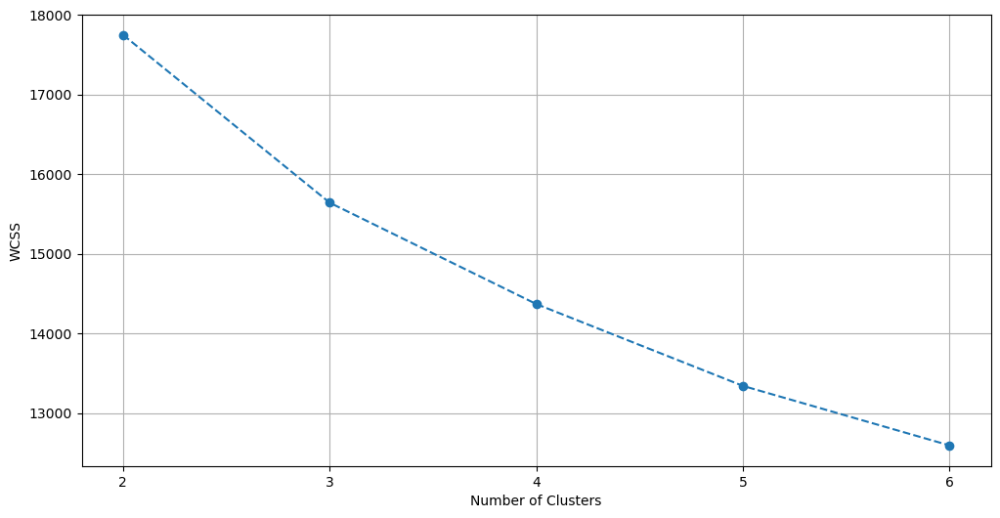

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15640.497922,0.282946,29.914645,1.859044,0.236248,17.118766,1.948236


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15640.497922,0.421603,2.398016,1.068603,0.213203,2.542504,0.790614


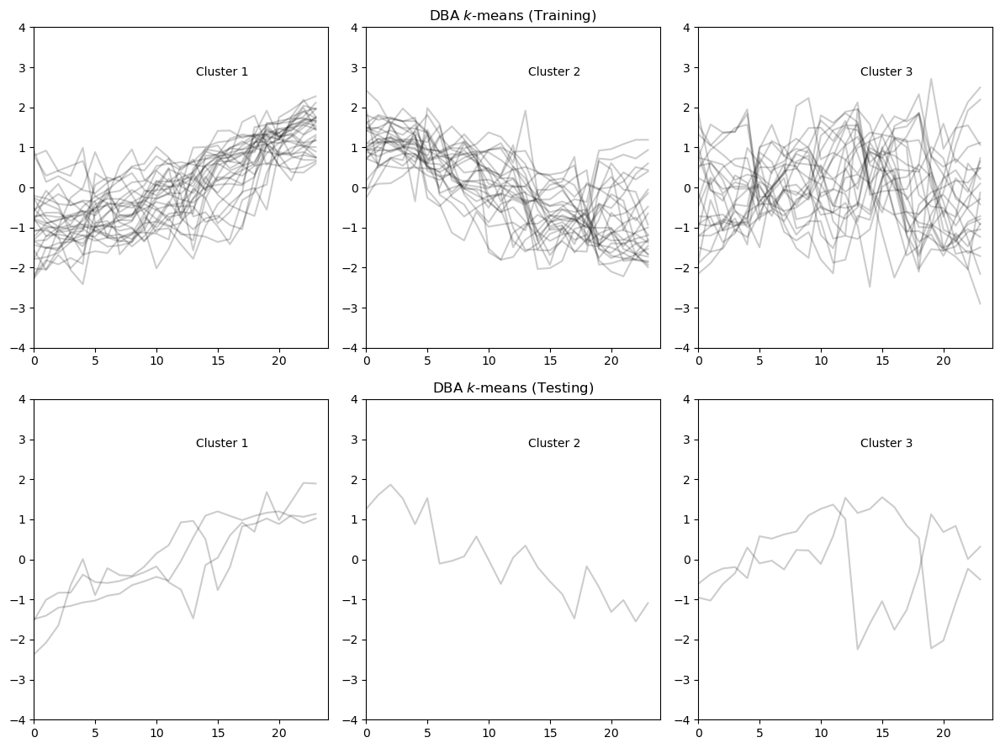

In [38]:
point8_comp_pred_results = generate_train_test_split_results(df, n_components=0.8)

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.99it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-2.140510e-13,24.0,0.419473,0.053397,-0.020716,-0.082317,...,0.793730,0.793730,1.517152,1.306844,1.838799,2.293413,2.579625,2.707270,0.0,1.561852
1,0.0,0.0,0.0,0.0,6.084022e-14,24.0,0.321532,-0.091977,0.004883,-0.139878,...,0.793730,0.793730,1.285293,1.468140,2.243619,2.649159,2.871476,2.890372,0.0,1.620558
2,0.0,0.0,0.0,0.0,-4.407585e-14,24.0,0.386569,-0.055142,-0.013821,-0.008060,...,0.535961,0.793730,1.732659,1.531967,2.263858,2.524058,2.652588,2.707270,0.0,1.485976
3,0.0,0.0,0.0,0.0,-5.517808e-14,24.0,0.326490,0.015070,0.017946,0.039334,...,0.793730,0.793730,1.043794,1.581363,2.265239,2.649159,2.770974,2.813355,0.0,1.535919
4,0.0,0.0,0.0,0.0,3.743672e-13,24.0,0.642222,-0.011652,-0.012727,-0.046950,...,0.687092,1.178655,1.951260,1.680460,2.425480,2.692311,2.871476,2.890372,0.0,1.389067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-4.884981e-14,24.0,0.240896,0.108922,0.005964,-0.208100,...,0.271189,0.535961,2.031759,1.641230,2.359466,2.787788,2.798513,2.813355,0.0,1.612914
74,1.0,0.0,0.0,0.0,-3.363976e-13,24.0,0.382289,-0.104666,-0.019780,0.052481,...,1.031767,1.377820,2.098147,1.620593,2.466577,2.787788,2.944439,2.890372,0.0,1.345687
75,0.0,0.0,0.0,0.0,6.461498e-14,24.0,0.185084,0.102253,0.003431,0.272446,...,0.271189,0.271189,1.303876,1.364204,1.897368,2.289952,2.625048,2.813355,0.0,1.341862
76,0.0,0.0,0.0,0.0,1.083578e-13,24.0,0.405061,0.064018,-0.015402,0.099829,...,0.687092,0.793730,1.732659,1.427679,2.111590,2.622996,2.871476,2.890372,0.0,1.563839


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.10s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,-3.796963e-13,24.0,0.306347,-0.133997,-0.003480,-0.349153,...,0.535961,0.535961,1.839297,1.657180,2.334549,2.857103,2.944439,2.890372,0.0,1.364258
1,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
2,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
3,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
4,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994
5,0.0,0.0,0.0,0.0,-1.013412e-12,24.0,0.343735,-0.090558,0.003112,-0.352405,...,0.535961,0.937156,2.204785,1.526775,2.131830,2.524058,2.698011,2.813355,0.0,1.612140


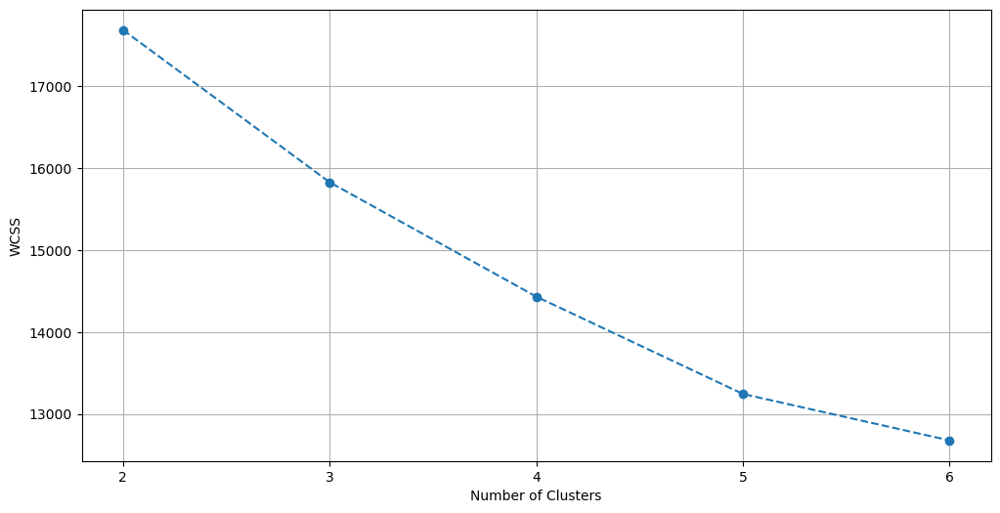

Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15827.802533,0.257886,25.016391,2.013547,0.259154,16.338543,2.141936


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15827.802533,0.416349,6.098896,0.299199,0.1901,2.846348,0.457566


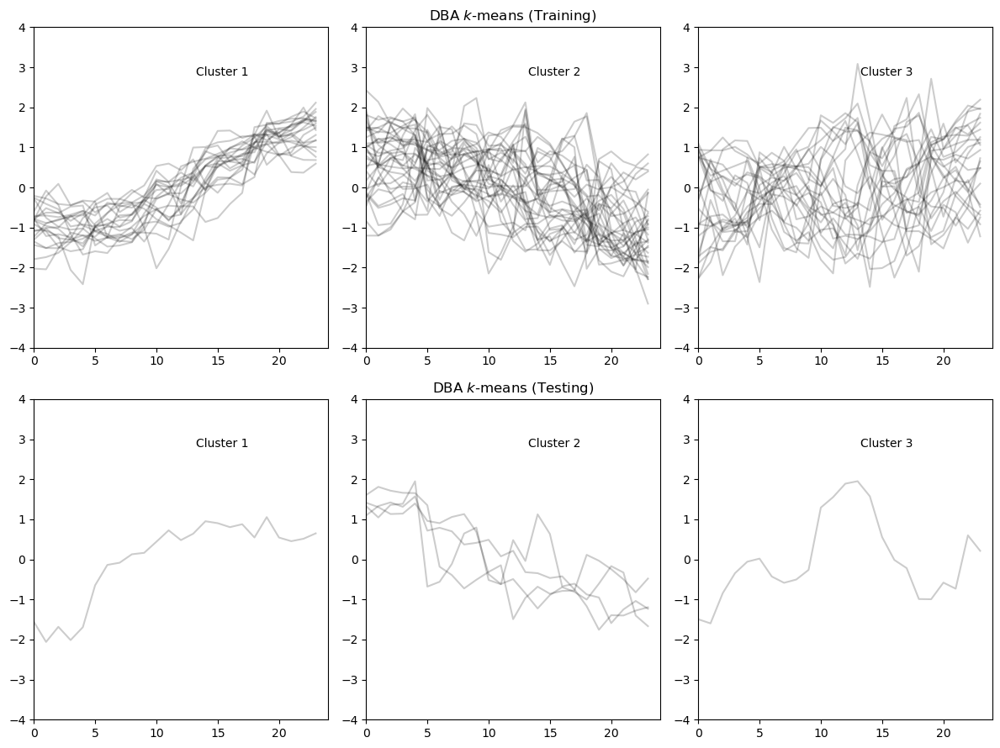

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.34it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,2.065015e-13,24.0,0.239640,0.108974,0.007723,0.163207,...,0.271189,0.271189,1.671595,1.373004,2.029396,2.524058,2.652588,2.707270,0.0,1.449096
1,0.0,0.0,0.0,0.0,-5.617729e-13,24.0,0.487631,0.152095,-0.005901,0.208599,...,0.535961,0.793730,1.884871,1.680460,2.359466,2.692311,2.871476,2.890372,0.0,1.565684
2,0.0,0.0,0.0,0.0,1.045830e-13,24.0,0.335758,0.000601,0.016697,0.241685,...,0.535961,0.793730,1.484458,1.567236,2.397267,2.718473,2.770974,2.813355,0.0,1.426338
3,0.0,0.0,0.0,0.0,4.498624e-13,24.0,0.306370,-0.080594,-0.008853,-0.224293,...,0.687092,0.793730,1.410514,1.707390,2.516410,2.857103,2.944439,2.890372,0.0,1.405955
4,0.0,0.0,0.0,0.0,3.719247e-13,24.0,0.636021,-0.124546,-0.011186,0.212779,...,0.687092,1.178655,1.692409,1.546599,2.146095,2.484367,2.770974,2.813355,0.0,1.591291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-5.417888e-14,24.0,0.568946,-0.111470,0.002061,-0.315104,...,1.412745,1.925121,2.458311,1.751084,2.557508,2.995732,2.944439,2.890372,0.0,1.442709
74,0.0,0.0,0.0,0.0,-2.970957e-13,24.0,0.232172,-0.099540,-0.003485,0.144855,...,0.271189,0.271189,1.178655,1.657994,2.441661,2.622996,2.725550,2.813355,0.0,1.455212
75,1.0,0.0,0.0,0.0,-2.886580e-13,24.0,0.438643,0.074242,-0.006435,-0.240491,...,0.830518,0.937156,1.631345,1.570383,2.136507,2.553682,2.798513,2.890372,0.0,1.621519
76,1.0,0.0,0.0,0.0,8.881784e-16,24.0,0.283416,0.095907,0.014496,0.467283,...,0.535961,0.535961,1.326920,1.550559,2.177604,2.524058,2.652588,2.707270,0.0,1.572994


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.09s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.656098e-13,24.0,0.540308,-0.084657,0.000635,-0.012983,...,0.937156,1.303876,2.311423,1.656676,2.557508,2.787788,2.944439,2.890372,0.0,1.648566
1,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
2,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
3,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
4,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417
5,0.0,0.0,0.0,0.0,4.440892e-16,24.0,0.230265,-0.124036,-0.007623,0.234123,...,0.271189,0.271189,1.377820,1.516522,2.372350,2.830940,2.944439,2.890372,0.0,1.491655


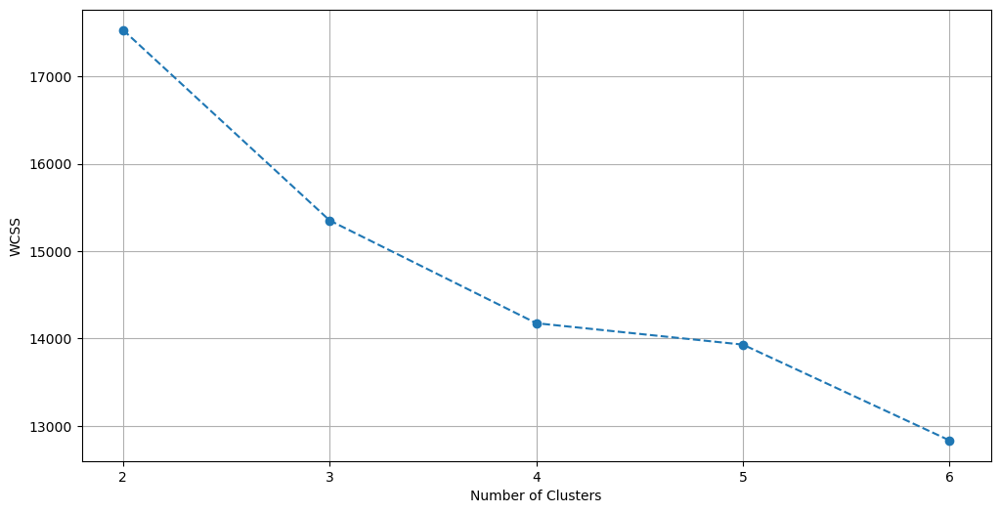

Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15350.898166,0.278188,27.450319,2.132404,0.249752,18.062234,1.968673


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15350.898166,0.18708,1.606406,1.315592,0.325801,3.377076,1.090727


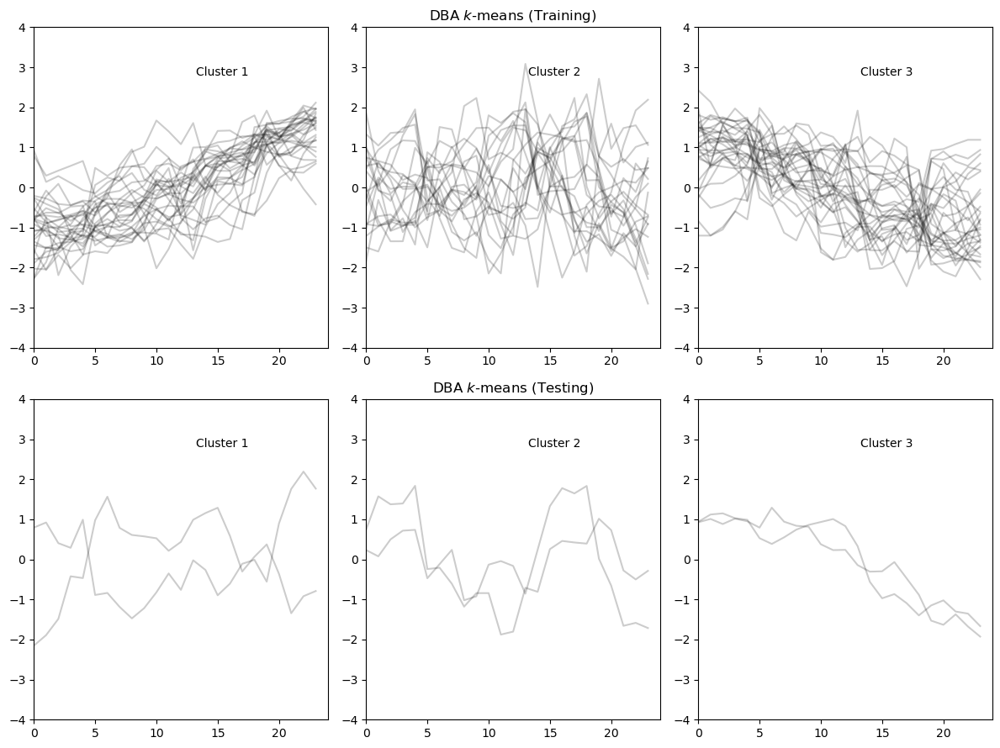

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.16it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,5.018208e-13,24.0,0.621284,-0.117071,-0.010043,0.013040,...,1.072017,1.285293,1.925121,1.576898,2.318368,2.787788,2.944439,2.890372,0.0,1.640659
1,1.0,0.0,0.0,0.0,-8.615331e-14,24.0,0.592768,-0.033562,0.033783,0.024077,...,1.072017,1.418069,2.351673,1.708708,2.375647,2.926418,2.944439,2.890372,0.0,1.551195
2,0.0,0.0,0.0,0.0,6.150636e-14,24.0,0.484463,-0.010443,0.011137,0.481173,...,0.687092,1.178655,2.057898,1.571197,2.334549,2.857103,2.871476,2.890372,0.0,1.506075
3,1.0,0.0,0.0,0.0,-1.709743e-13,24.0,0.302137,-0.068818,0.022547,-0.138479,...,0.535961,0.535961,1.178655,1.518350,2.265239,2.649159,2.770974,2.813355,0.0,1.483494
4,0.0,0.0,0.0,0.0,1.256772e-13,24.0,0.247025,0.117478,-0.001461,-0.464381,...,0.271189,0.535961,1.285293,1.112021,1.659081,2.037405,2.287773,2.428274,0.0,1.519176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,1.0,0.0,0.0,0.0,4.853895e-13,24.0,0.227151,-0.113128,-0.011214,0.457230,...,0.535961,0.793730,1.484458,1.388449,2.108294,2.622996,2.798513,2.890372,0.0,1.304997
74,0.0,0.0,0.0,0.0,-5.715428e-13,24.0,0.474234,-0.044379,-0.014185,-0.224917,...,0.793730,0.793730,2.098147,1.756276,2.714452,2.926418,2.944439,2.890372,0.0,1.576422
75,1.0,0.0,0.0,0.0,-3.033129e-13,24.0,0.511423,0.042324,-0.012517,-0.187153,...,0.793730,1.043794,2.204785,1.751084,2.623522,2.857103,2.944439,2.890372,0.0,1.511276
76,0.0,0.0,0.0,0.0,-3.130829e-13,24.0,0.468057,0.059283,-0.003001,0.293475,...,0.687092,1.043794,2.311423,1.546599,2.284716,2.718473,2.798513,2.813355,0.0,1.554417


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.07s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,7.904788e-14,24.0,0.279414,-0.096743,-0.005585,0.134211,...,0.535961,0.535961,1.178655,1.657180,2.293452,2.718473,2.871476,2.890372,0.0,1.380878
1,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
2,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
3,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
4,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826
5,0.0,0.0,0.0,0.0,7.416290e-13,24.0,0.397261,0.123295,-0.001317,-0.254585,...,0.830518,1.303876,2.138397,1.540306,2.136507,2.510529,2.698011,2.813355,0.0,1.634657


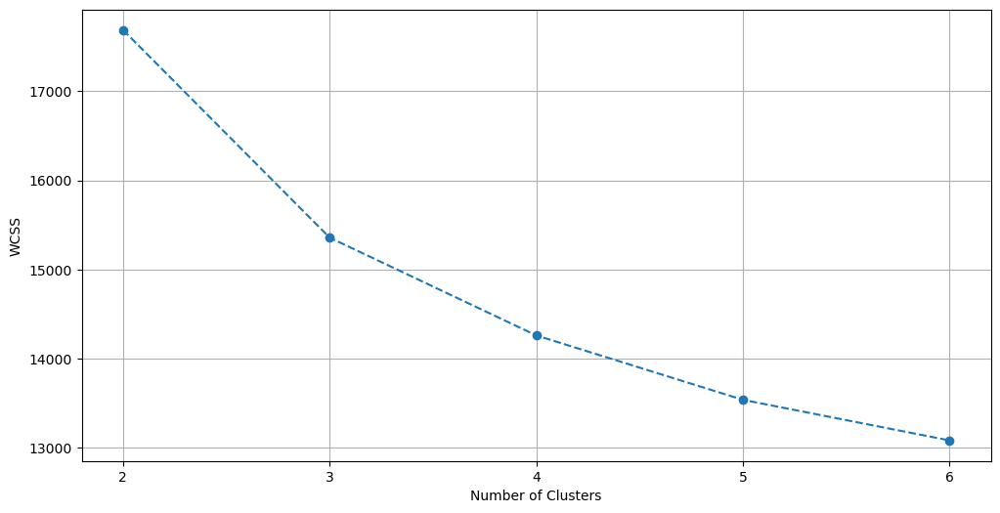

Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15357.818168,0.294737,29.360258,1.927932,0.221596,17.879961,1.945203


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15357.818168,0.136303,2.458493,1.336116,0.180749,2.608084,0.952198


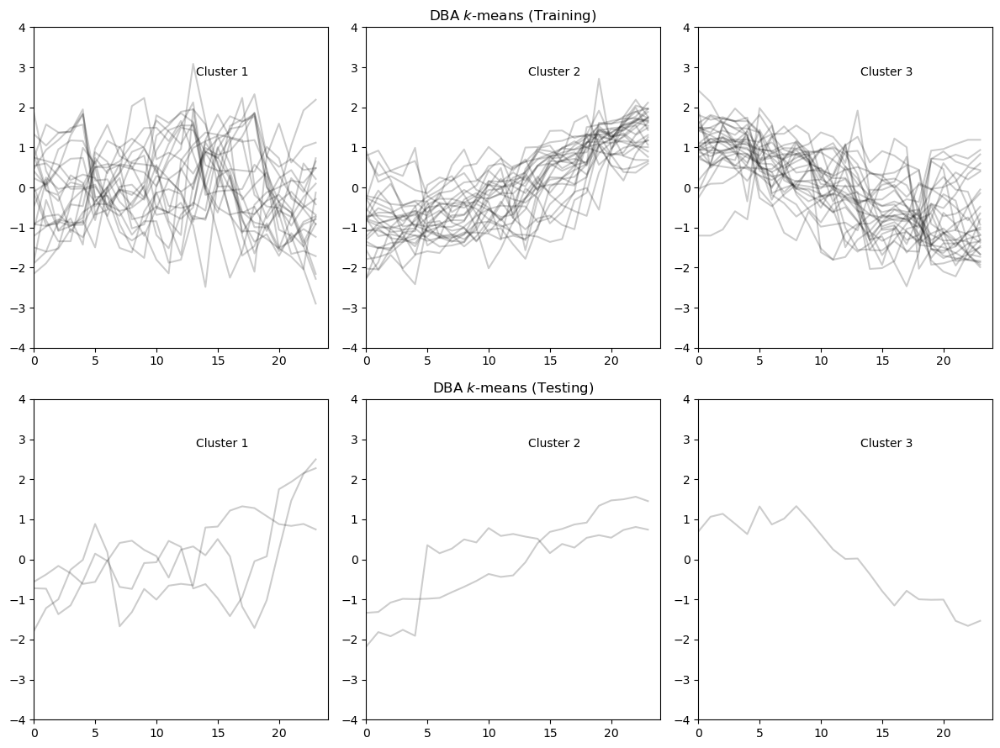

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.42it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,1.896261e-13,24.0,0.201673,-0.129051,0.002027,0.464347,...,0.535961,0.793730,1.631345,1.578721,2.243619,2.501357,2.698011,2.813355,0.0,1.594400
1,1.0,0.0,0.0,0.0,1.394440e-13,24.0,0.433708,-0.094681,-0.014649,0.243460,...,0.687092,0.937156,2.351673,1.729346,2.623522,2.857103,2.944439,2.890372,0.0,1.403072
2,0.0,0.0,0.0,0.0,3.246292e-13,24.0,0.227536,0.122829,0.007731,-0.468421,...,0.687092,1.043794,2.031759,1.577489,2.197844,2.458204,2.520903,2.582306,0.0,1.579667
3,1.0,0.0,0.0,0.0,-1.743050e-13,24.0,0.323063,-0.068031,-0.000576,-0.196351,...,0.535961,0.535961,2.098147,1.400287,1.970827,2.314664,2.378620,2.443306,0.0,1.510660
4,0.0,0.0,0.0,0.0,-3.641532e-14,24.0,0.222375,0.127096,-0.003530,0.309669,...,0.271189,0.687092,1.043794,1.309991,1.974885,2.441215,2.652588,2.736339,0.0,1.434105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,1.394440e-13,24.0,0.137773,0.121247,-0.003016,-0.382016,...,0.271189,0.535961,1.178655,0.838728,1.219137,1.607575,1.903648,2.133629,0.0,1.424464
74,0.0,0.0,0.0,0.0,-7.256418e-13,24.0,0.504203,0.139814,0.008562,0.091803,...,0.937156,1.410514,2.351673,1.567236,2.425480,2.787788,2.944439,2.890372,0.0,1.642819
75,0.0,0.0,0.0,0.0,-2.398082e-14,24.0,0.250941,0.127150,-0.009858,0.460718,...,0.793730,0.793730,1.839297,1.606466,2.306336,2.649159,2.798513,2.890372,0.0,1.595811
76,0.0,0.0,0.0,1.0,4.440892e-16,24.0,0.413249,0.110330,-0.016155,0.081939,...,0.535961,0.535961,1.732659,1.538260,2.133211,2.622996,2.798513,2.890372,0.0,1.401826


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.15s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,6.568079e-13,24.0,0.362205,0.148735,-0.012228,-0.350958,...,0.793730,1.043794,2.204785,1.492738,2.309633,2.692311,2.798513,2.890372,0.0,1.560885
1,0.0,0.0,0.0,0.0,-2.255973e-13,24.0,0.162353,0.109294,0.000665,-0.239022,...,0.535961,0.535961,1.410514,1.222602,1.656454,2.094641,2.378620,2.443306,0.0,1.260538
2,1.0,0.0,0.0,0.0,-2.547962e-13,24.0,0.556319,0.040252,0.001525,0.161798,...,0.687092,1.263626,2.351673,1.562044,2.595309,2.857103,2.944439,2.890372,0.0,1.518300
3,0.0,0.0,0.0,0.0,2.429390e-12,24.0,0.494184,0.019648,-0.004418,-0.065238,...,0.793730,1.043794,2.098147,1.684924,2.516410,2.857103,2.944439,2.890372,0.0,1.578973
4,0.0,0.0,0.0,0.0,-2.158274e-13,24.0,0.532661,-0.101884,0.002404,-0.072318,...,0.535961,1.118969,2.098147,1.684924,2.598605,2.857103,2.871476,2.890372,0.0,1.550838
5,1.0,0.0,0.0,0.0,6.785683e-13,24.0,0.412636,0.152559,-0.005118,0.077436,...,1.303876,1.732659,2.031759,1.555751,2.238941,2.553682,2.770974,2.890372,0.0,1.487860


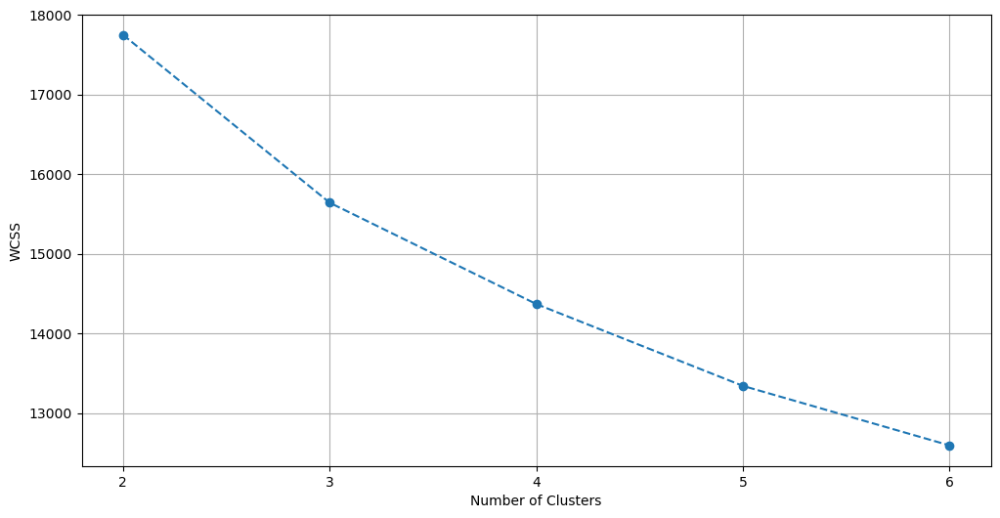

Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15640.497922,0.282946,29.914645,1.859044,0.236248,17.118766,1.948236


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,15640.497922,0.421603,2.398016,1.068603,0.213203,2.542504,0.790614


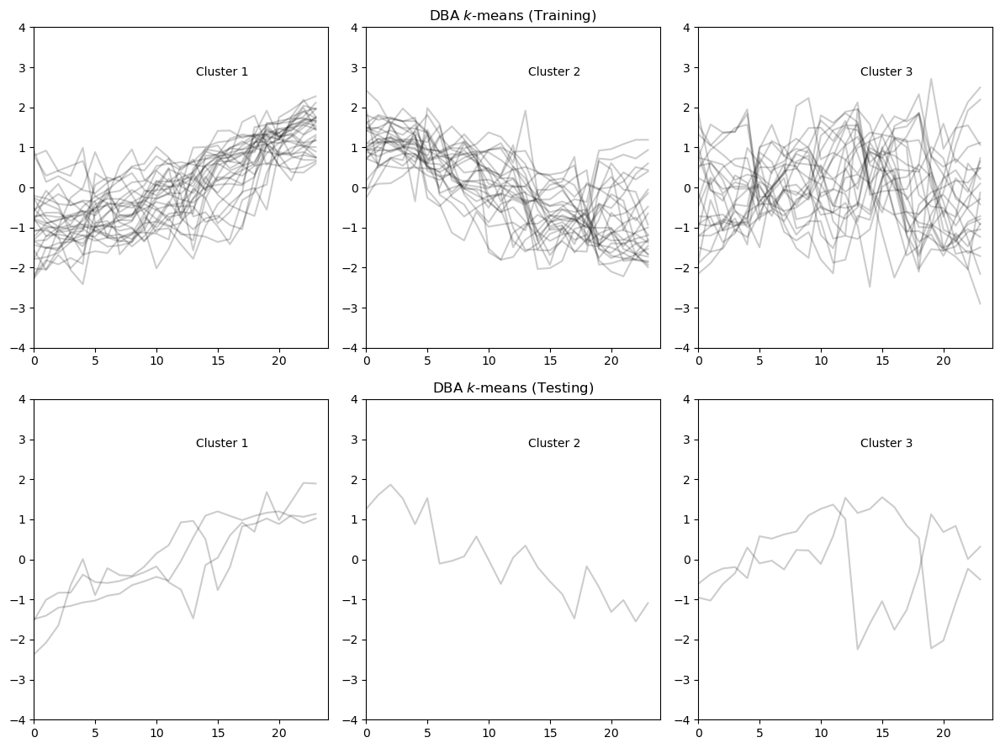

In [46]:
# Using optimal_k
point8_comp_optimal_k_pred_results = generate_train_test_split_results(df, n_components=0.8, predefined_k=3)

### Plot cluster results in subplots

In [39]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

color_palette = px.colors.qualitative.Safe

def plot_clusters(df, index, y_pred, fig, row, col, cluster_legends):    
    X_df = df.loc[index]
    # Plot background 
    fig.add_trace(go.Scatter(y=X_df.Close, x=X_df.Datetime, mode="lines", line_color='lightgrey', showlegend=False), row=row, col=col)
    
    X_df.set_index("Datetime", inplace = True)
    X_group_df = X_df.groupby(pd.Grouper(freq='W'))
    
    # Retrieve indices of clusters labelled, starting with 0
    for cluster_label in np.unique(y_pred):
        grp_indices = np.where(y_pred == cluster_label)[0]
        # Iterate through each group and add it as trace
        grp_keys = list(X_group_df.groups.keys())
        for i, grp_idx in enumerate(grp_indices):
            X_sub_df = X_group_df.get_group(grp_keys[grp_idx])
            X_sub_df.reset_index(inplace=True)
            if i == 0 and cluster_label not in cluster_legends:
                # Check if trace is the first of its legend group
                fig.add_trace(go.Scatter(y=X_sub_df.Close, x=X_sub_df.Datetime, mode="lines", line_color=color_palette[cluster_label], legendgroup=f"Cluster_{cluster_label+1}", name=f"Cluster_{cluster_label+1}"), row=row, col=col)
                cluster_legends.append(cluster_label)
            else:
                fig.add_trace(go.Scatter(y=X_sub_df.Close, x=X_sub_df.Datetime, mode="lines", line_color=color_palette[cluster_label], legendgroup=f"Cluster_{cluster_label+1}", showlegend=False), row=row, col=col)
    
    
def plot_clustering_predictions_subplots(df, pred_results):
    df = df.reset_index()
    count = 1
    cluster_legends = []
    # subplot setup
    fig = make_subplots(rows=len(pred_results), cols=1, shared_xaxes=True, vertical_spacing=0.05,
                        subplot_titles=[f"Train_Test_Clustering Plot {x} ({len(np.unique(pred_results[x - 1][0]))} Clusters)" for x in range(1, len(pred_results)+1)])

    for train_index, test_index in tscv.split(df, date_column='Datetime'):
        y_pred_train, y_pred_test = pred_results[count - 1]
        print(f"y_pred_train: {y_pred_train}")
        print(f"y_pred_test: {y_pred_test}")

    #     fig = go.Figure()
        plot_clusters(df, train_index, y_pred_train, fig, count, 1, cluster_legends)

        # Add rect and line to split train and test set
        fig.add_vrect(x0=(df.loc[train_index].iat[0,0] - relativedelta(days=1)).timestamp() * 1000, x1=df.loc[test_index].iat[0,0].timestamp() * 1000, 
                  annotation_text="training_set", annotation_position="top left",
    #               annotation=dict(font_size=20, font_family="Times New Roman"),
                  fillcolor="orange", opacity=0.1, line_width=0, row=count, col=1)
        fig.add_vrect(x0=df.loc[test_index].iat[0,0].timestamp() * 1000, x1=df.loc[test_index].iat[-1,0].timestamp() * 1000, 
              annotation_text="testing_set", annotation_position="top left",
    #               annotation=dict(font_size=20, font_family="Times New Roman"),
              fillcolor="green", opacity=0.1, line_width=0, row=count, col=1)
        fig.add_vline(x=df.loc[test_index].iat[0,0].timestamp() * 1000, annotation_text="train_test_split", annotation_position="bottom left", annotation_textangle = -90, line_width=2, line_dash="dash", line_color="grey", row=count, col=1)

        plot_clusters(df, test_index, y_pred_test, fig, count, 1, cluster_legends)
        count += 1

    fig.update_layout(
        plot_bgcolor='white',
        title=f"Train_Test_Clustering Plots",
        height=1500,
    #     width=600,
    )

    fig.update_xaxes(
            mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey',
        range=[start, end],
        rangebreaks=[
            dict(values=[x for x in list(nyse_holidays.keys()) if x.weekday() != 4]),  # hide NYSE holidays excluding those that fall on a Friday. 
            # Plotly rangebreaks bug makes them overlap
            dict(bounds=["sat", "mon"]), #hide weekends
            dict(bounds=[16, 9.5], pattern="hour"), #hide hours outside of 9am-5pm
        ],
    )

    fig.update_yaxes(
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey'
    )
    # Enable autoscale for x-axis
    fig['layout']['xaxis'].update(autorange = True)

    fig.show()

In [42]:
plot_clustering_predictions_subplots(df, three_comp_pred_results)

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196
y_pred_train: [2 1 1 1 2 2 0 0 1 1 2 1 2 2 1 1 0 2 1 1 0 1 0 1 0 0 2 0 1 2 1 0 1 1 2 1 2
 2 0 1 0 1 0 0 1 1 2 2 0 0 1 0 0 1 1 1 0 1 2 2 0 1 2 2 0 1 2 0 1 0 2 0 1 0
 1 0 2 2]
y_pred_test: [1 2 1 2 0 1]
y_pred_train: [0 0 1 1 2 1 2 2 1 1 0 2 1 1 0 1 0 1 0 0 2 0 1 2 1 0 1 1 2 1 2 2 0 1 0 1 0
 0 1 1 2 2 0 0 1 0 0 2 1 1 0 1 2 2 0 1 0 2 0 1 2 0 1 0 2 0 1 0 1 0 2 2 1 2
 1 2 0 1]
y_pred_test: [2 1 2 0 2 1]
y_pred_train: [0 0 2 2 1 0 2 2 1 2 1 2 1 1 0 1 2 0 2 1 2 2 0 0 0 0 1 2 1 2 1 1 2 2 0 0 1
 1 2 1 1 0 2 2 1 2 0 0 1 2 0 0 1 2 0 

In [47]:
plot_clustering_predictions_subplots(df, point8_comp_optimal_k_pred_results)

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196
y_pred_train: [2 1 1 2 2 2 0 2 1 1 1 1 1 2 1 1 0 2 1 1 0 1 0 2 0 0 2 0 1 1 1 0 1 1 1 1 2
 2 2 1 0 1 0 0 1 1 2 2 2 0 1 0 0 1 1 1 2 1 2 2 0 1 2 1 2 1 1 0 2 0 2 0 1 0
 1 0 2 2]
y_pred_test: [1 1 1 2 0 1]
y_pred_train: [0 0 2 2 1 2 1 1 2 2 0 1 2 2 0 2 0 2 0 0 1 0 2 1 2 0 2 2 1 2 1 1 0 2 0 2 0
 0 2 2 1 1 0 0 2 0 0 1 2 2 0 2 1 1 0 2 0 1 0 2 1 0 2 0 1 0 2 0 2 0 0 1 2 1
 2 1 0 2]
y_pred_test: [1 2 1 0 0 2]
y_pred_train: [0 0 2 2 1 0 2 2 1 2 1 2 1 1 0 1 2 0 2 1 2 2 0 2 0 0 1 2 1 2 1 1 2 2 0 0 1
 1 2 1 1 0 2 2 1 2 0 0 1 2 1 0 1 2 0 

### Additional Analysis: Stationary Differenced Dataset (Returns) 

In [48]:
def adfuller_test(df):
    result=adfuller(df)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )

    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis (Ho). We should reject the null hypothesis. Hence, input data is stationary")
    else:
        print("Weak evidence against null hypothesis, indicating that the input data is non-stationary ")


In [49]:
df_time_series = df.Close.ravel()
print(adfuller_test(df_time_series))

ADF Test Statistic : -1.4856727798674985
p-value : 0.5405865300206485
#Lags Used : 9
Number of Observations : 3443
Weak evidence against null hypothesis, indicating that the input data is non-stationary 
None


In [50]:
df_differenced_time_series = preprocessing.differencing(np.log(df_time_series), smooth=0.1)
print(adfuller_test(df_differenced_time_series))
df_differenced = pd.DataFrame(df_differenced_time_series, index=df.index[1:], columns=['Close'])

ADF Test Statistic : -8.822619260110308
p-value : 1.859623629124658e-14
#Lags Used : 30
Number of Observations : 3421
Strong evidence against the null hypothesis (Ho). We should reject the null hypothesis. Hence, input data is stationary
None


In [51]:
df_differenced

,Close
Datetime,
2022-01-31 10:30:00-05:00,-0.000544
2022-01-31 11:30:00-05:00,0.000559
2022-01-31 12:30:00-05:00,0.001310
2022-01-31 13:30:00-05:00,0.001618
2022-01-31 14:30:00-05:00,0.001603
...,...
2024-01-19 11:30:00-05:00,0.002052
2024-01-19 12:30:00-05:00,0.001880
2024-01-19 13:30:00-05:00,0.001525


Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2616 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.19it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,1.110223e-15,24.0,0.413059,0.016271,-0.035215,0.497973,...,0.687092,0.687092,1.285293,1.373004,2.083378,2.553682,2.798513,2.890372,0.0,1.497566
1,0.0,0.0,0.0,0.0,-4.440892e-16,24.0,0.288269,-0.045038,0.013596,0.048982,...,0.535961,0.793730,1.043794,1.502905,2.212109,2.553682,2.698011,2.813355,0.0,1.510340
2,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.435875,0.018352,-0.022560,-0.078688,...,0.687092,0.937156,1.517152,1.157033,1.656938,2.154783,2.579625,2.736339,0.0,1.567223
3,1.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.325839,0.008952,-0.002790,-0.311361,...,0.429323,0.687092,0.793730,1.288252,1.740423,2.180946,2.579625,2.813355,0.0,1.570881
4,0.0,0.0,0.0,0.0,0.000000e+00,24.0,0.496300,-0.026345,-0.016419,-0.181170,...,0.925129,1.072017,1.517152,1.570383,2.293452,2.718473,2.944439,2.890372,0.0,1.623438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.485528,0.028489,-0.011558,-0.024663,...,0.687092,1.043794,1.517152,1.273403,1.769488,2.197935,2.579625,2.813355,0.0,1.546740
74,0.0,0.0,0.0,0.0,3.330669e-16,24.0,0.356684,-0.053281,-0.005315,0.255225,...,0.429323,0.687092,1.285293,1.135934,1.590923,1.912304,2.229051,2.524168,0.0,1.545935
75,0.0,0.0,0.0,0.0,2.664535e-15,24.0,0.454245,0.068976,-0.007284,0.078134,...,1.178655,1.517152,1.737983,1.209928,1.803141,2.224098,2.447940,2.582306,0.0,1.647850
76,0.0,0.0,0.0,0.0,7.771561e-16,24.0,0.333143,-0.003411,0.000697,0.236548,...,0.535961,0.535961,1.285293,1.225239,1.608395,1.986530,2.287773,2.553237,0.0,1.568029


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.14s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,1.998401e-15,24.0,0.459590,-0.035104,0.027973,0.375329,...,0.535961,0.793730,1.631345,1.277406,1.747868,2.037405,2.302014,2.428274,0.0,1.554370
1,0.0,0.0,0.0,0.0,-6.661338e-16,24.0,0.673437,0.030797,-0.011502,0.139150,...,0.925129,1.072017,1.692409,1.429724,2.040899,2.649159,2.770974,2.813355,0.0,1.476823
2,1.0,0.0,0.0,0.0,4.440892e-16,24.0,0.404856,-0.007770,0.003454,-0.302171,...,0.937156,1.285293,1.631345,1.373004,2.083378,2.666149,2.944439,2.890372,0.0,1.591352
3,1.0,0.0,0.0,0.0,-1.332268e-15,24.0,0.472735,0.022533,-0.011119,0.284347,...,0.687092,0.793730,1.178655,1.299233,1.814644,2.289952,2.625048,2.813355,0.0,1.525891
4,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.319419,-0.048770,0.013331,-0.185486,...,0.271189,0.535961,1.410514,1.197310,1.750011,2.025326,2.305657,2.505290,0.0,1.548054
5,1.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.375111,0.051018,0.019105,0.204053,...,0.535961,0.535961,1.285293,1.223193,1.860419,2.345737,2.725550,2.890372,0.0,1.595310


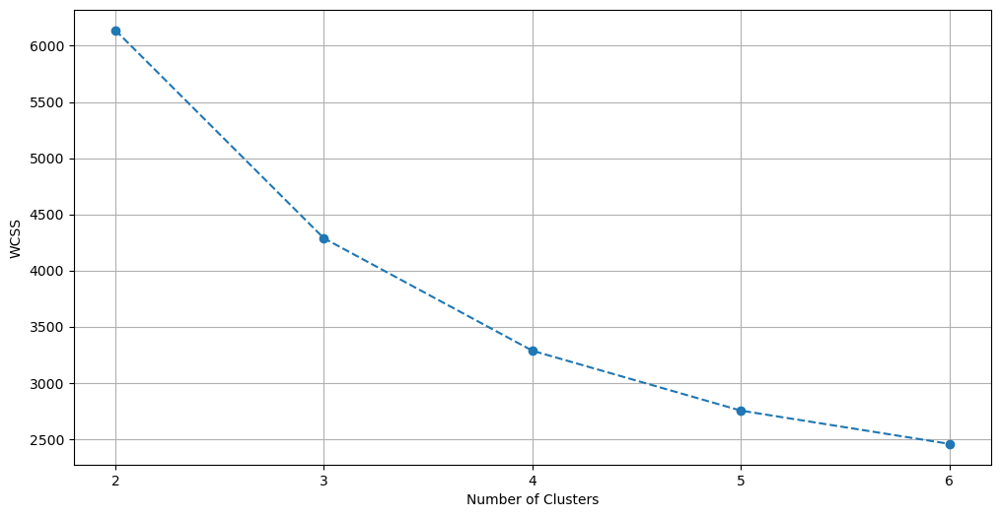

Determining optimal_k...
Optimal k is found to be 4
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,3285.823022,0.08882,8.569831,2.768217,0.258051,43.185854,0.959956


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,3285.823022,-0.067494,1.303608,0.988515,0.040992,5.589113,0.584492


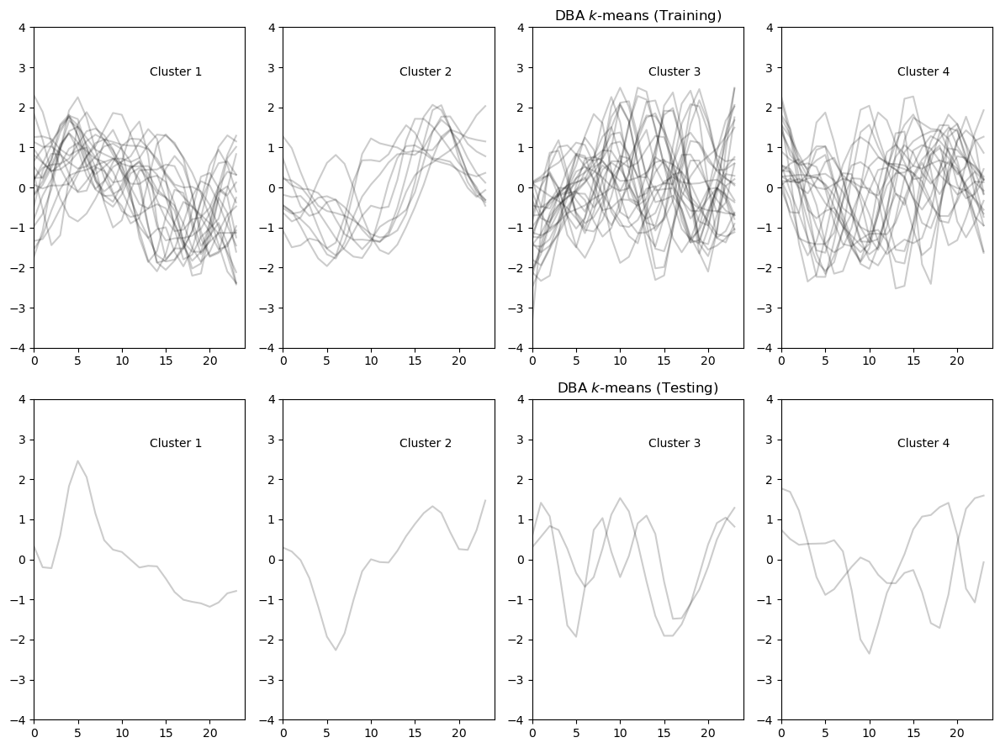

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.26it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.369956,0.078093,-0.003176,0.155591,...,1.418069,1.524707,1.945935,1.570383,2.334549,2.830940,2.944439,2.890372,0.0,1.628776
1,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.499254,0.007721,0.012655,0.128870,...,0.793730,0.793730,1.043794,1.446998,2.136507,2.579844,2.871476,2.890372,0.0,1.605143
2,0.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.385934,0.045873,0.010634,-0.047882,...,0.535961,0.793730,1.178655,1.167286,1.619898,2.151322,2.625048,2.813355,0.0,1.555583
3,1.0,0.0,0.0,0.0,4.440892e-16,24.0,0.412347,-0.138972,-0.008921,0.196940,...,0.535961,0.535961,1.517152,0.956237,1.276551,1.604622,1.935673,2.260204,0.0,1.518020
4,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.429850,0.061054,-0.009492,-0.188589,...,0.937156,1.178655,1.517152,1.053472,1.498840,1.929849,2.305657,2.443306,0.0,1.569648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-6.661338e-16,24.0,0.673437,0.030797,-0.011502,0.139150,...,0.925129,1.072017,1.692409,1.429724,2.040899,2.649159,2.770974,2.813355,0.0,1.476823
74,1.0,0.0,0.0,0.0,4.440892e-16,24.0,0.404856,-0.007770,0.003454,-0.302171,...,0.937156,1.285293,1.631345,1.373004,2.083378,2.666149,2.944439,2.890372,0.0,1.591352
75,1.0,0.0,0.0,0.0,-1.332268e-15,24.0,0.472735,0.022533,-0.011119,0.284347,...,0.687092,0.793730,1.178655,1.299233,1.814644,2.289952,2.625048,2.813355,0.0,1.525891
76,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.319419,-0.048770,0.013331,-0.185486,...,0.271189,0.535961,1.410514,1.197310,1.750011,2.025326,2.305657,2.505290,0.0,1.548054


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:07<00:00,  1.28s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,4.440892e-16,24.0,0.446652,-0.047047,0.017966,0.116096,...,0.937156,0.937156,1.737983,1.490692,2.218702,2.553682,2.871476,2.890372,0.0,1.596273
1,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.476304,-0.036344,0.002882,0.103006,...,0.687092,0.793730,1.178655,1.452695,2.017364,2.510529,2.871476,2.890372,0.0,1.597762
2,0.0,0.0,0.0,0.0,2.220446e-16,24.0,0.440044,-0.006450,-0.001333,-0.242262,...,0.535961,0.793730,1.410514,1.360200,1.867774,2.246799,2.479122,2.736339,0.0,1.622148
3,1.0,0.0,0.0,0.0,2.220446e-16,24.0,0.428075,0.012980,-0.018532,-0.100351,...,0.793730,0.793730,1.285293,1.225239,1.817940,2.371900,2.725550,2.813355,0.0,1.587113
4,0.0,0.0,0.0,0.0,1.776357e-15,24.0,0.509159,0.085419,0.012017,-0.267478,...,0.687092,1.072017,1.737983,1.342927,1.979562,2.553682,2.725550,2.813355,0.0,1.512312
5,1.0,0.0,0.0,0.0,1.110223e-16,24.0,0.364461,-0.098304,0.016198,-0.137413,...,0.937156,1.410514,1.737983,1.286207,1.797701,2.250260,2.652588,2.813355,0.0,1.608816


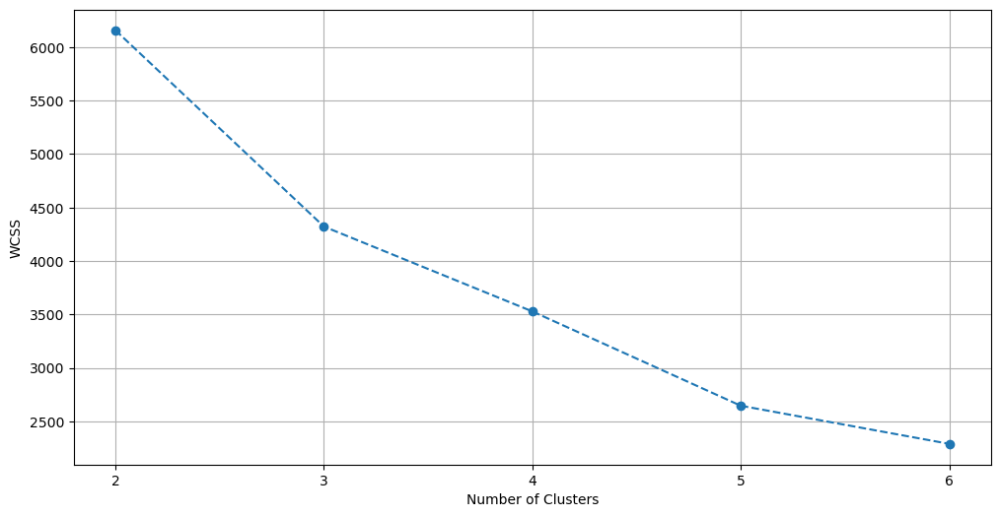

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4322.14166,0.131411,10.267803,2.632025,0.203961,40.210371,1.134064


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4322.14166,0.071426,1.663023,1.255943,0.201239,5.941946,0.872668


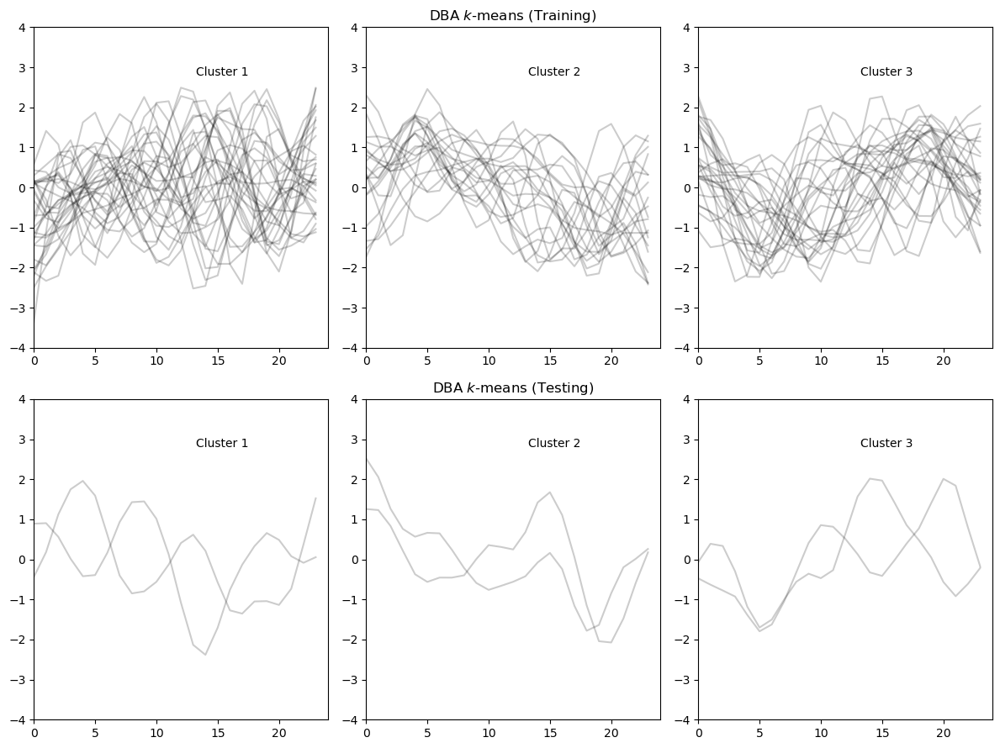

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.88it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.503424,-0.007925,-0.014178,0.093378,...,1.178655,1.178655,1.737983,1.446998,2.199225,2.718473,2.871476,2.890372,0.0,1.506378
1,0.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.570916,-0.020682,-0.018344,0.003978,...,0.790268,0.937156,1.737983,1.309991,1.951350,2.484367,2.725550,2.813355,0.0,1.566418
2,0.0,0.0,0.0,0.0,-1.332268e-15,24.0,0.429012,0.064580,-0.010518,-0.162331,...,0.687092,0.793730,1.410514,1.023716,1.392398,1.799037,2.081599,2.366289,0.0,1.569661
3,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.467582,0.100961,0.022798,0.122365,...,0.937156,1.043794,1.410514,1.272942,1.869155,2.428581,2.770974,2.890372,0.0,1.569585
4,0.0,0.0,0.0,0.0,-2.664535e-15,24.0,0.494523,-0.122540,0.012483,0.153412,...,0.793730,0.793730,1.410514,1.313489,2.040899,2.622996,2.871476,2.890372,0.0,1.659498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.476304,-0.036344,0.002882,0.103006,...,0.687092,0.793730,1.178655,1.452695,2.017364,2.510529,2.871476,2.890372,0.0,1.597762
74,0.0,0.0,0.0,0.0,2.220446e-16,24.0,0.440044,-0.006450,-0.001333,-0.242262,...,0.535961,0.793730,1.410514,1.360200,1.867774,2.246799,2.479122,2.736339,0.0,1.622148
75,1.0,0.0,0.0,0.0,2.220446e-16,24.0,0.428075,0.012980,-0.018532,-0.100351,...,0.793730,0.793730,1.285293,1.225239,1.817940,2.371900,2.725550,2.813355,0.0,1.587113
76,0.0,0.0,0.0,0.0,1.776357e-15,24.0,0.509159,0.085419,0.012017,-0.267478,...,0.687092,1.072017,1.737983,1.342927,1.979562,2.553682,2.725550,2.813355,0.0,1.512312


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:07<00:00,  1.21s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-3.108624e-15,24.0,0.429376,0.045653,0.025290,0.314382,...,0.793730,0.793730,1.737983,1.526775,2.306336,2.830940,2.871476,2.890372,0.0,1.430927
1,0.0,0.0,0.0,0.0,5.773160e-15,24.0,0.522545,-0.086044,-0.021549,-0.005896,...,1.043794,1.410514,1.631345,1.465807,2.177604,2.553682,2.798513,2.813355,0.0,1.646916
2,1.0,0.0,0.0,0.0,0.000000e+00,24.0,0.492901,0.046831,-0.023082,-0.178758,...,0.937156,1.285293,1.517152,1.279100,1.807290,2.197935,2.579625,2.659323,0.0,1.606158
3,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.374043,0.027359,0.006570,-0.262326,...,0.535961,0.535961,1.285293,1.286207,1.855742,2.224098,2.447940,2.582306,0.0,1.590059
4,0.0,0.0,0.0,0.0,-1.332268e-15,24.0,0.375246,-0.091144,-0.002258,-0.110029,...,0.535961,0.793730,0.793730,1.209928,1.653641,1.968090,2.274475,2.553237,0.0,1.413934
5,0.0,0.0,0.0,0.0,1.776357e-15,24.0,0.471656,-0.072675,-0.032945,-0.189129,...,0.793730,0.793730,1.410514,1.301652,1.913548,2.319575,2.725550,2.736339,0.0,1.653561


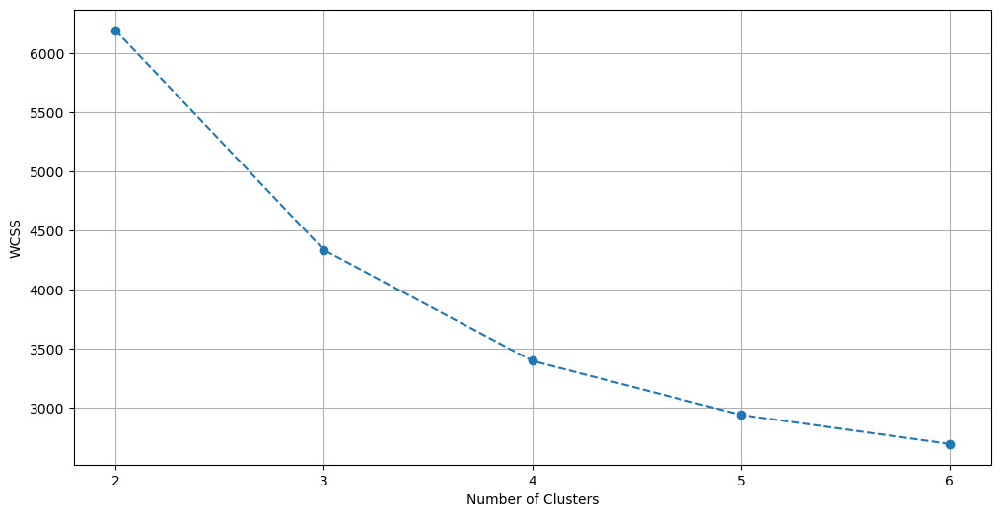

Determining optimal_k...
Optimal k is found to be 4
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,3397.515609,0.060394,7.042979,2.900064,0.271718,39.788543,1.053855


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=4,3397.515609,-0.17188,0.670488,1.784252,0.28422,1.980372,0.852691


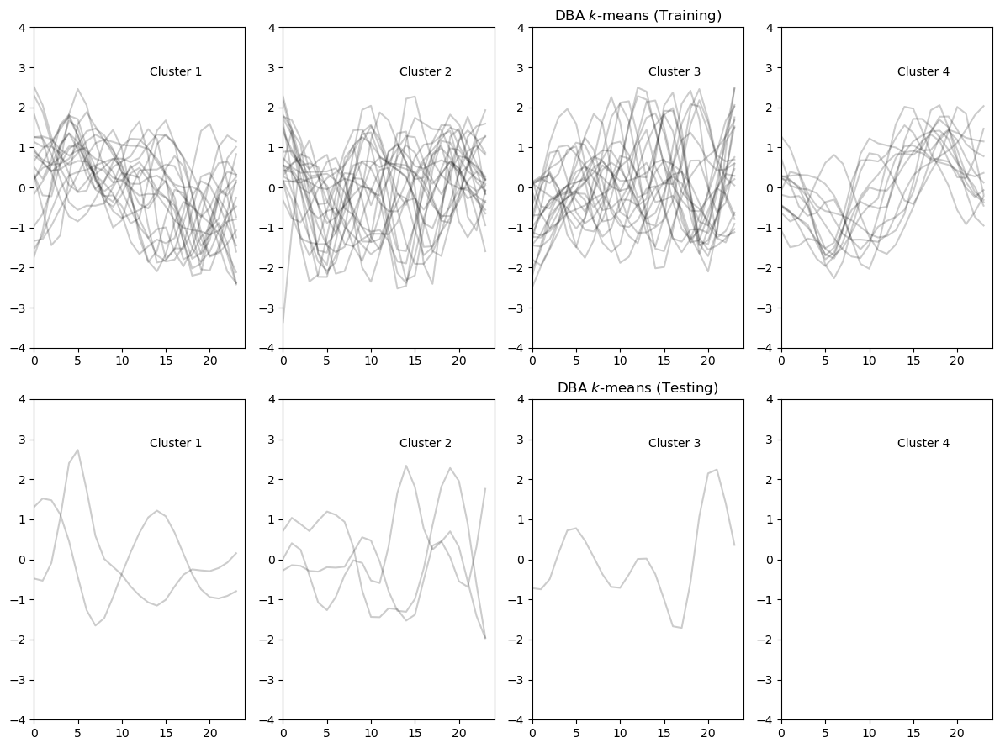

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 39/39 [00:11<00:00,  3.29it/s]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.376983,-0.111595,-0.014613,0.267187,...,0.535961,0.793730,1.285293,1.446998,2.199225,2.692311,2.944439,2.890372,0.0,1.568480
1,0.0,0.0,0.0,0.0,-2.220446e-16,24.0,0.399391,0.161490,-0.001902,0.194366,...,0.793730,0.793730,1.285293,0.822561,1.128206,1.435474,1.732552,1.966176,0.0,1.542430
2,0.0,0.0,0.0,0.0,-3.552714e-15,24.0,0.358292,-0.071235,0.002763,-0.278195,...,0.535961,0.937156,1.285293,0.922981,1.241376,1.567181,1.895420,2.216102,0.0,1.482763
3,1.0,0.0,0.0,0.0,-1.554312e-15,24.0,0.556072,-0.066686,-0.019935,0.169480,...,0.937156,1.410514,1.945935,1.365897,2.042280,2.527519,2.725550,2.890372,0.0,1.633767
4,0.0,0.0,0.0,0.0,1.332268e-15,24.0,0.393647,-0.016370,-0.026441,0.143264,...,0.687092,0.937156,1.285293,1.086729,1.524426,1.937666,2.068885,2.133629,0.0,1.483655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0.0,0.0,0.0,0.0,5.773160e-15,24.0,0.522545,-0.086044,-0.021549,-0.005896,...,1.043794,1.410514,1.631345,1.465807,2.177604,2.553682,2.798513,2.813355,0.0,1.646916
74,1.0,0.0,0.0,0.0,0.000000e+00,24.0,0.492901,0.046831,-0.023082,-0.178758,...,0.937156,1.285293,1.517152,1.279100,1.807290,2.197935,2.579625,2.659323,0.0,1.606158
75,0.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.374043,0.027359,0.006570,-0.262326,...,0.535961,0.535961,1.285293,1.286207,1.855742,2.224098,2.447940,2.582306,0.0,1.590059
76,0.0,0.0,0.0,0.0,-1.332268e-15,24.0,0.375246,-0.091144,-0.002258,-0.110029,...,0.535961,0.793730,0.793730,1.209928,1.653641,1.968090,2.274475,2.553237,0.0,1.413934


Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.14s/it]


,Close__variance_larger_than_standard_deviation,Close__has_duplicate_max,Close__has_duplicate_min,Close__has_duplicate,Close__sum_values,Close__abs_energy,Close__mean_abs_change,Close__mean_change,Close__mean_second_derivative_central,Close__median,...,Close__fourier_entropy__bins_5,Close__fourier_entropy__bins_10,Close__fourier_entropy__bins_100,Close__permutation_entropy__dimension_3__tau_1,Close__permutation_entropy__dimension_4__tau_1,Close__permutation_entropy__dimension_5__tau_1,Close__permutation_entropy__dimension_6__tau_1,Close__permutation_entropy__dimension_7__tau_1,Close__query_similarity_count__query_None__threshold_0.0,Close__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,0.0,0.000000e+00,24.0,0.399606,0.151712,-0.023571,0.070306,...,1.043794,1.285293,1.737983,1.427679,2.149392,2.649159,2.798513,2.813355,0.0,1.602907
1,0.0,0.0,0.0,0.0,-1.776357e-15,24.0,0.397877,0.030139,0.017847,-0.185139,...,1.043794,1.285293,1.517152,1.550559,2.359466,2.787788,2.871476,2.890372,0.0,1.612545
2,0.0,0.0,0.0,0.0,0.000000e+00,24.0,0.449283,-0.038679,0.013365,0.262313,...,0.793730,1.178655,1.737983,1.514476,2.240322,2.649159,2.871476,2.890372,0.0,1.627808
3,0.0,0.0,0.0,0.0,1.332268e-15,24.0,0.346562,-0.115288,-0.021456,0.238007,...,0.687092,0.687092,0.687092,1.299233,1.880658,2.359266,2.625048,2.813355,0.0,1.523167
4,1.0,0.0,0.0,0.0,-8.881784e-16,24.0,0.320303,0.194382,0.028639,0.125138,...,0.793730,1.043794,1.737983,1.299553,1.970827,2.524058,2.770974,2.813355,0.0,1.524623
5,1.0,0.0,0.0,0.0,0.000000e+00,24.0,0.470597,-0.122581,-0.018825,-0.164048,...,0.937156,1.303876,1.631345,1.157033,1.681854,2.111631,2.552085,2.813355,0.0,1.648533


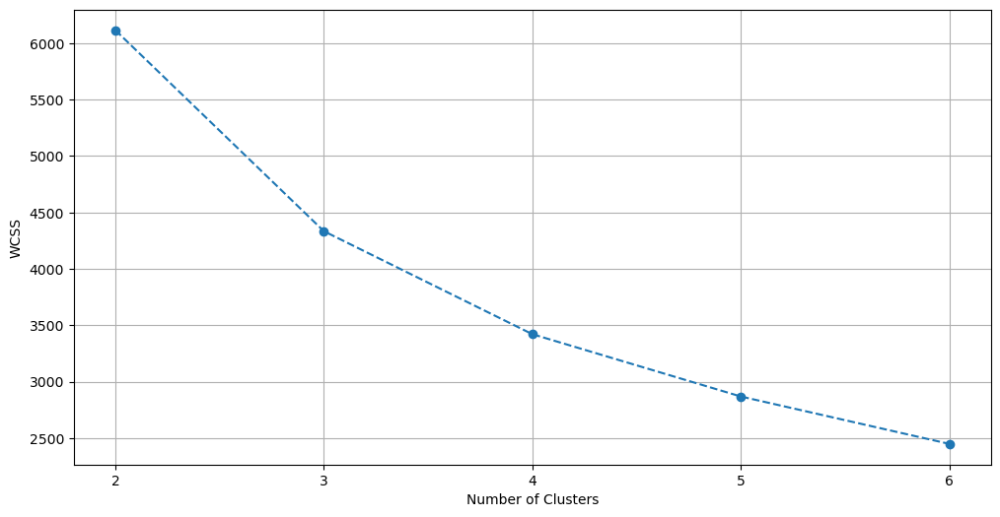

Determining optimal_k...
Optimal k is found to be 3
Training Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4333.930117,0.10013,7.453289,3.510851,0.236098,37.613155,1.115651


Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,silhouette_pca,calinski_harabasz_pca,davies_bouldin_pca
k=3,4333.930117,0.19945,1.669382,1.007211,0.121132,4.031828,0.718265


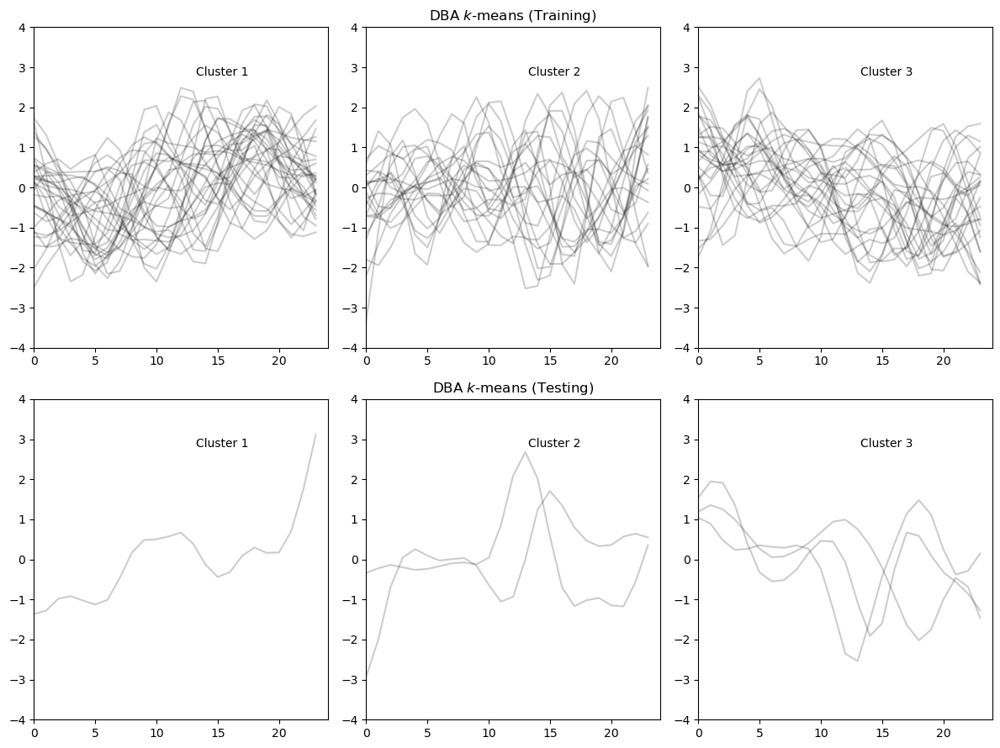

In [54]:
pred_results_differenced = generate_train_test_split_results(df_differenced, n_components=3)

In [55]:
plot_clustering_predictions_subplots(df, pred_results_differenced)

Train period: 2022-01-31 - 2023-07-31 , Test period 2023-07-31 - 2023-09-11 # train records 2617 , # test records 203
Train period: 2022-03-14 - 2023-09-11 , Test period 2023-09-11 - 2023-10-23 # train records 2617 , # test records 210
Train period: 2022-04-25 - 2023-10-23 , Test period 2023-10-23 - 2023-12-04 # train records 2624 , # test records 199
Train period: 2022-06-06 - 2023-12-04 , Test period 2023-12-04 - 2024-01-15 # train records 2620 , # test records 196
y_pred_train: [0 0 0 1 2 2 2 3 0 3 2 0 2 0 2 2 3 2 0 2 1 3 0 2 0 1 2 3 0 0 2 2 3 0 2 0 2
 3 3 3 3 3 0 2 1 0 2 2 1 3 1 3 2 2 0 2 1 0 3 0 3 3 2 0 1 3 2 3 1 1 3 0 2 2
 3 2 0 3]
y_pred_test: [3 2 3 2 0 1]
y_pred_train: [0 0 1 2 0 1 0 1 0 0 2 0 1 0 2 2 1 0 1 2 0 2 1 1 0 0 2 1 0 1 0 2 1 0 2 2 1
 0 2 1 0 0 2 2 2 2 0 0 1 0 2 1 0 1 2 2 0 1 2 2 0 2 2 2 0 1 0 0 2 0 1 0 2 0
 2 0 1 2]
y_pred_test: [1 0 2 2 0 1]
y_pred_train: [2 0 2 2 1 2 0 2 3 1 0 2 0 3 2 1 0 0 2 2 1 0 2 0 2 1 0 1 1 1 0 2 3 0 1 2 3
 1 3 1 2 2 0 2 3 0 2 0 1 1 2 0 3 1 2 